# Imports

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import ast
import seaborn as sns
import json
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap, BoundaryNorm

import tensorflow as tf
from Fitting_algo_v3 import *
from ECM_impedance_v3 import *

# Load Lab EIS Data

In [2]:
input_files = ["format_GMJuly2022_CELL042_EIS_1_P25C_15P0PSI_20220916_R0_CH005_01_MB_CA5.csv", "format_GMJuly2022_CELL042_EOLeis_2_P25C_15P0PSI_20231011_R0_CA6.csv",
               "format_GMJuly2022_CELL050_EIS_1_P25C_15P0PSI_20220919_R0_CH003_01_MB_CA3.csv", "format_GMJuly2022_CELL050_EOLeis_2_P25C_15P0PSI_20231016_R0_CA6.csv",
               "format_GMJuly2022_CELL090_EIS_1_P25C_15P0PSI_20220919_R0_CH005_01_MB_CA5.csv", "format_GMJuly2022_CELL090_EOLeis_2_P25C_15P0PSI_20231016_R0_CA7.csv",
               "format_GMJuly2022_CELL021_BOL_Characterization_R1_01_MB_CA5.csv","format_GMJuly2022_CELL021_EOLeis_2_P25C_15P0PSI_20230329_R1_CA6.csv",
               "format_GMJuly2022_CELL009_BOL_Characterization_R1_01_MB_CA6.csv", "format_GMJuly2022_CELL009_EOLeis_2_P25C_15P0PSI_20230425_R0_CA3.csv",
               "format_GMJuly2022_CELL070_EOLeis_2_P25C_15P0PSI_20230804_R0_CA6.csv", "format_GMJuly2022_CELL032_EOLeis_2_P25C_15P0PSI_20230509_R1_CA3.csv"]


battery_names = ["battery42_BOL", "battery42_EOL", "battery50_BOL", "battery50_EOL",
                 "battery90_BOL", "battery90_EOL", "battery21_BOL", "battery21_EOL",
                 "battery09_BOL", "battery09_EOL", "battery70_EOL", "battery32_EOL",]

temp25 = ["42", "50", "90"]
temp0 = ["21", "09"]
temp45 = ["70", "32"]

## Build EIS Lookup Dictionary

In [3]:
all_battery_data = {}

# Should change to correct parent folder
curdir = os.getcwd()
print("Current directory:", curdir)
dir = os.path.dirname(curdir)
print("Parent directory:", dir)
dir = os.path.join(dir, "formattedEIS")

input_files = [os.path.join(dir, input_file) for input_file in input_files ]

for i in range(len(input_files)):
    input_file = input_files[i]
    battery_name = battery_names[i]
    df = pd.read_csv(input_file)
    df.columns = ['Ewe/V', 'time/s','freq/Hz','|Z|/Ohm','Phase(Z)/deg','z cycle', 'Z_real','Z_imag']

    df['z cycle'] = df['z cycle'].astype(int)

    cycle_groups = df.groupby('z cycle')
    formatted_data = {}
    all_battery_data[battery_name] = {}
    for cycle, cycle_data in cycle_groups:
        group_sorted = cycle_data.sort_values('freq/Hz')

        freq = group_sorted['freq/Hz'].values
        neg_ImZ = -group_sorted['Z_imag'].values
        reZ = group_sorted['Z_real'].values
        z_mag = group_sorted['|Z|/Ohm'].values

        
        all_battery_data[battery_name][cycle+1] = {
            'freq': freq,
            'angular_freq': freq * 2 * np.pi,
            'reZ': reZ,
            'neg_ImZ': neg_ImZ,
            'z_mag': z_mag
        }

Current directory: c:\liuhan\Research Projects\EV Battery\ECM_OptimizationAlgorithm\V3_8ECM
Parent directory: c:\liuhan\Research Projects\EV Battery\ECM_OptimizationAlgorithm


In [4]:
# print(all_battery_data["battery42_BOL"][11]['neg_ImZ'])
# print(all_battery_data["battery42_BOL"][11]['angular_freq'])
# print(all_battery_data["battery42_BOL"][11]['freq'])
print(all_battery_data["battery42_BOL"][11]['z_mag'])
# np.max(all_battery_data["battery42_BOL"][11]['z_mag'])

[0.08634451 0.08571564 0.08508014 0.08445241 0.08386354 0.08320867
 0.0824744  0.08167752 0.08074505 0.07973176 0.07858088 0.0773103
 0.07597594 0.07458196 0.07319128 0.07188083 0.07064431 0.06954091
 0.06853119 0.06759074 0.06670728 0.06584352 0.06492943 0.06397756
 0.06292979 0.0617978  0.06057158 0.05923819 0.05780745 0.05626404
 0.05459864 0.0527995  0.05087938 0.04881402 0.04659188 0.04422374
 0.04171755 0.03907381 0.03631944 0.03349482 0.030636   0.02778504
 0.02499962 0.02229334 0.01972348 0.0173123  0.01509169 0.01303692
 0.01120512 0.00957296]


Build SOC Data

In [5]:
with open("../battery_info.json", "r") as f:
    soc_json = json.load(f)

# Initialize the SOC map
soc_map = {}

for cell_key, cell_data in soc_json.items():
    # Extract ID and SOH
    parts = cell_key.split("_")  # e.g., CELL009_BOL → ['CELL009', 'BOL']
    cell_id = parts[0].replace("CELL0", "")  # '009'
    soh = parts[1]  # 'BOL' or 'EOL'

    # Build key matching your battery_names style
    battery_key = f"battery{cell_id}_{soh}"  # e.g., 'battery09_BOL'

    for cycle_str, soc_str in cell_data["cycles"].items():
        cycle = int(cycle_str)
        soc_value = float(soc_str.replace("SOC = ", "").replace("%", ""))
        soc_map[(battery_key, cycle)] = soc_value

In [6]:
soc_map[("battery42_BOL", 11)]  # Example access
# soc_map

7.03

# Find Best ECM Fitting with Powell, L-BFGS-B, or Trust-Constr

In [8]:
ECM_names = ["v3CM1","v3CM2","v3CM3","v3CM4","v3CM5","v3CM6", "v3CM7", "v3CM8"]
ECM_impedance_funcs = [compute_v3CM1_impedance, compute_v3CM2_impedance, compute_v3CM3_impedance, compute_v3CM4_impedance,
                       compute_v3CM5_impedance, compute_v3CM6_impedance, compute_v3CM7_impedance, compute_v3CM8_impedance,]


# Fitting Algorithm Trials Check

## Run Trials and Generate CSV Data

In [15]:
target_battery = "battery42_EOL"
target_ECM = "v3CM8"
cost_func_name = 'RMSE_abs'
trial_number = 10

for cycle in all_battery_data[target_battery].keys():
    print(f"Cycle {cycle} data for {target_battery}:")
    target_battery_data = all_battery_data[target_battery][cycle]
    Z_exp = target_battery_data["reZ"] - target_battery_data["neg_ImZ"]*1j
    angular_freq = target_battery_data["angular_freq"]
    
    ECM_candidate_impedance_func = ECM_impedance_funcs[ECM_names.index(target_ECM)]
    
    # Run the fitting algorithm
    best_params, best_err, err_str, trial_results = ECM_result_wrapper_new(Z_exp, angular_freq, 
        target_ECM, ECM_candidate_impedance_func, 
        trial_num=trial_number, ECM_initial_guess=None, ECM_bounds=None, 
        cost_func_name=cost_func_name, verbose=True, optimizer_option_Powell=None, 
        optimizer_option_BFGS=None
    )

    df_trial_results = pd.DataFrame(trial_results)
    # save the trial results to a CSV file
    # make folder if not exists
    output_dir = f"trial_results_{trial_number}/objFunc_{cost_func_name}"
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    
    output_file = f"{target_battery}_cycle{cycle}_trials{trial_number}_objFunc_{cost_func_name}_{target_ECM}.csv"
    save_path = os.path.join(output_dir, output_file)
    df_trial_results.to_csv(save_path, index=False)


Cycle 1 data for battery42_EOL:
[Trial 1] Trying initial guess: [0.00458511002351287, 0.00610162246721079, 0.005001143748173449, 0.008023325726318397, 0.00646755890817113, 0.029616929738439893, 0.8435268380479808, 0.08455607270430478, 0.8814181453615206, 0.5194083670016785, 0.8854550125925931, 0.005926097501983798, 0.8468014049516731, 0.001075623487278189]...
[Trial 2] Trying initial guess: [0.002636937965989631, 0.005852337550892011, 0.00917304802367127, 0.010586898284457517, 0.006403869385952338, 0.03490507445424394, 0.9541340223615967, 0.14682615757193976, 0.8664163520686637, 0.596161307834657, 0.967750047413287, 0.0069730333175192375, 0.82530795804656, 0.0009078109566465764]...
[Trial 3] Trying initial guess: [0.0033491520978228446, 0.006890712517147067, 0.005983468338330501, 0.009211076250050522, 0.01457889530150502, 0.05165826424865086, 0.9345378805110853, 0.0815515631006063, 0.933570166982685, 0.6673128359486864, 0.8132918899219546, 0.006250721574724838, 0.9879949960031691, 0.00

## Convert Data Format (Battery wise BOL+EOL trials with ordering)

In [16]:
def parse_errors(err_str):
    parts = err_str.split('|')
    rmse_abs = float(parts[0].split(':')[1].strip())
    rmse_rel = float(parts[1].split(':')[1].strip())
    return pd.Series([rmse_abs, rmse_rel], index=['RMSE_abs', 'RMSE_rel'])

In [18]:
# Setups
base_battery = "battery42"
target_ECM = "v3CM7"

cost_func_name = 'RMSE_abs'
trial_number = 10
# Unpack estimated_params
if target_ECM == "v3CM8":
    param_list = ['R0', 'R1', 'R2', 'R3', 'R4', 'C1', 'n1', 'C2', 'n2', 'C3', 'n3', 'C4', 'n4', 'Aw']
    num_rcs = 4
if target_ECM == "v3CM7":
    param_list = ['R0', 'R1', 'R2', 'R3', 'C1', 'n1', 'C2', 'n2', 'C3', 'n3', 'Aw']
    num_rcs = 3
    

all_rows = []
soh_states = ['BOL', 'EOL']

for soh in soh_states:
    # Build full battery name with SOH
    battery_name = f"{base_battery}_{soh}"
    for cycle in all_battery_data[battery_name].keys():
        file_path = f"trial_results_{trial_number}/objFunc_{cost_func_name}/{battery_name}_cycle{cycle}_trials{trial_number}_objFunc_{cost_func_name}_{target_ECM}.csv"
        
        if not os.path.exists(file_path):
            print(f"File not found: {file_path}")
            continue

        df = pd.read_csv(file_path)
        df.columns = df.columns.str.lower()  # Normalize column names (uppper case only for parameter names)

        # Add metadata
        df['battery_name'] = base_battery
        df['soh'] = soh
        df['cycle'] = cycle



        unpacked_params = df['estimated_params'].apply(lambda x: pd.Series(ast.literal_eval(x), index=param_list))

        errors_df = df['errors'].apply(parse_errors)

        # Compute taus: tau_RC = (R * C)^(1/n)
        tau_df = pd.DataFrame()
        freq_df = pd.DataFrame()
        for i in range(1, num_rcs + 1):
            R = unpacked_params[f'R{i}']
            C = unpacked_params[f'C{i}']
            n = unpacked_params[f'n{i}']
            tau = (R * C) ** (1 / n)
            freq = 1 / (2 * np.pi * tau)
            tau_df[f'tau{i}'] = tau
            freq_df[f'freq{i}(Hz)'] = freq


        # Combine everything
        merged_df = pd.concat([
            pd.DataFrame({
                'Battery_Name': df['battery_name'],
                'SOH': df['soh'],
                'Cycle': df['cycle'],
                'Trial_ID': df['trial_id'],  # ← FIXED
                'is_best': df['is_best']
            }),
            unpacked_params,
            tau_df,
            freq_df,
            errors_df
        ], axis=1)

        # Sort by RMSE_rel and reassign Trial_ID within each group
        merged_df = merged_df.sort_values(by='RMSE_abs').reset_index(drop=True)
        merged_df['Trial_ID'] = range(1, len(merged_df) + 1)

        all_rows.append(merged_df)


# Combine all data into final dataframe
format_df = pd.concat(all_rows, ignore_index=True)

# Save to CSV
output_path = f"trial_results_{trial_number}/objFunc_{cost_func_name}/Sorted_{base_battery}_{target_ECM}_{cost_func_name}.csv"
format_df.to_csv(output_path, index=False)

print(f"Saved to: {output_path}")



Saved to: trial_results_10/objFunc_RMSE_abs/Sorted_battery42_v3CM7_RMSE_abs.csv


# Trials Analysis Plots

## Normalized per-parameter across trials plots -- CM8

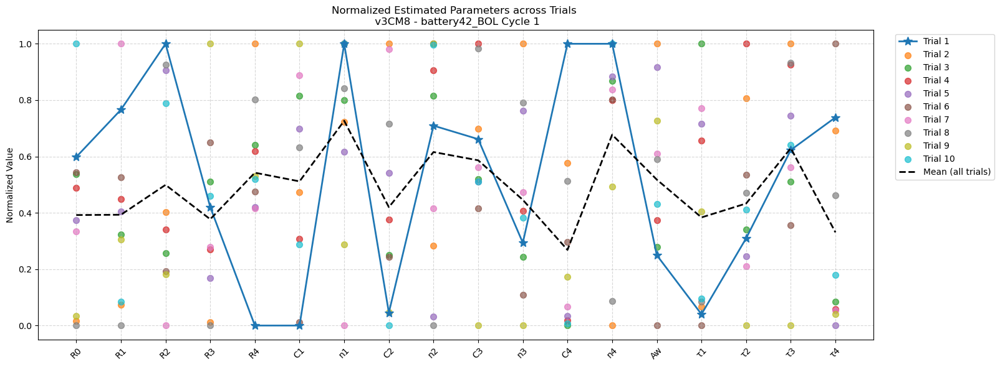

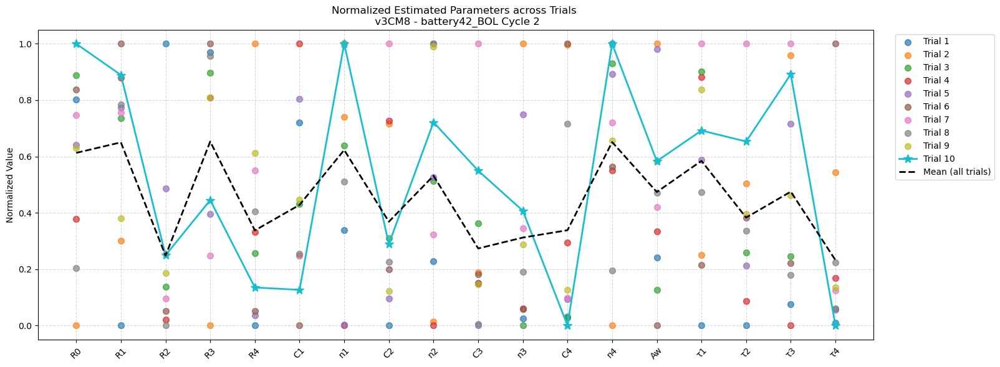

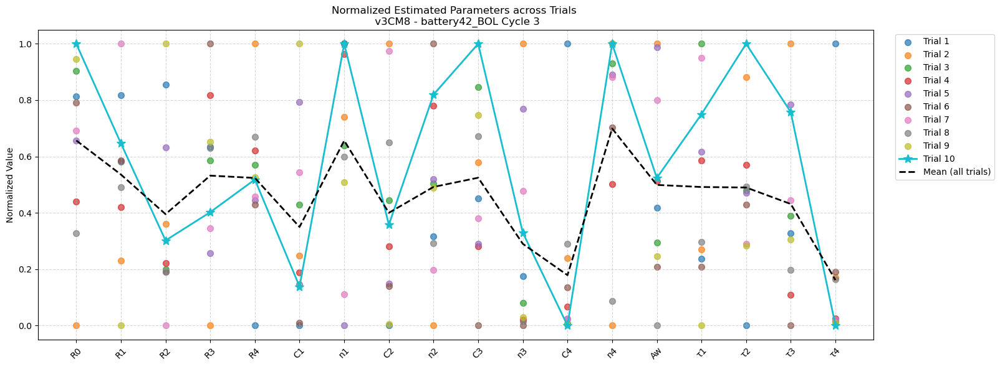

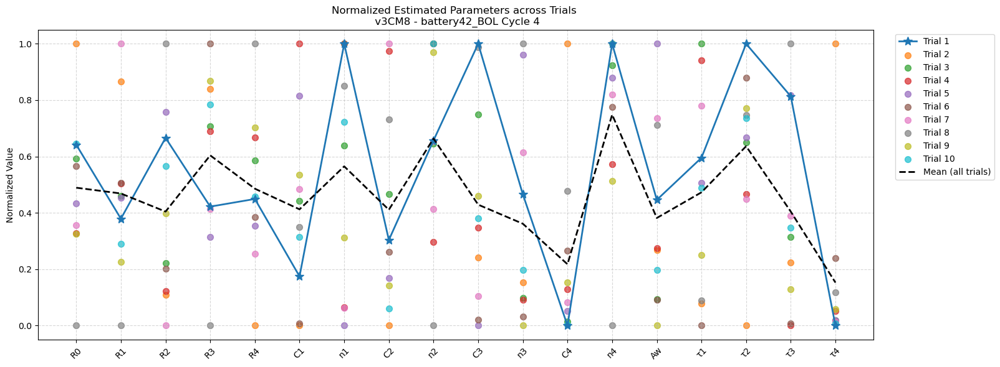

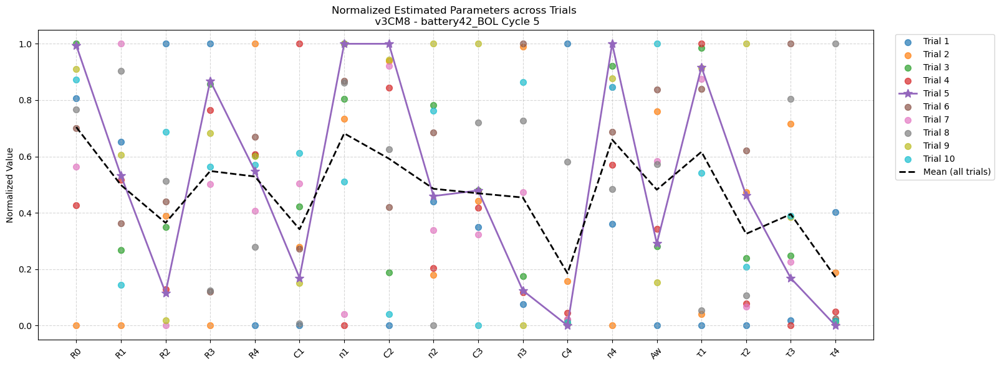

...

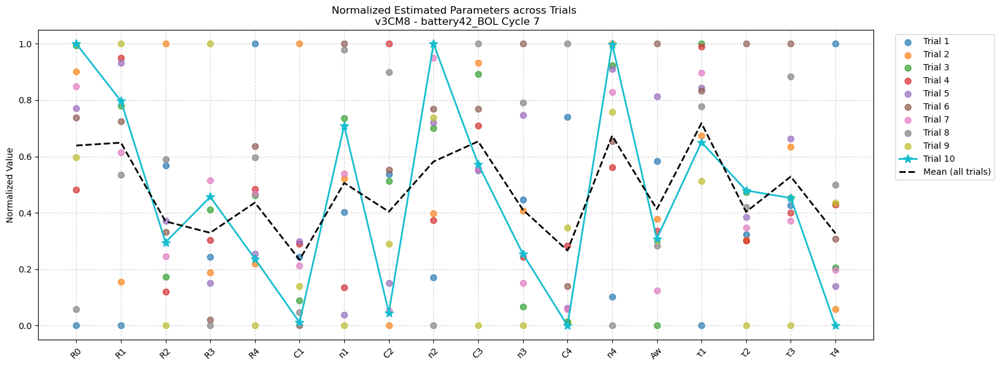

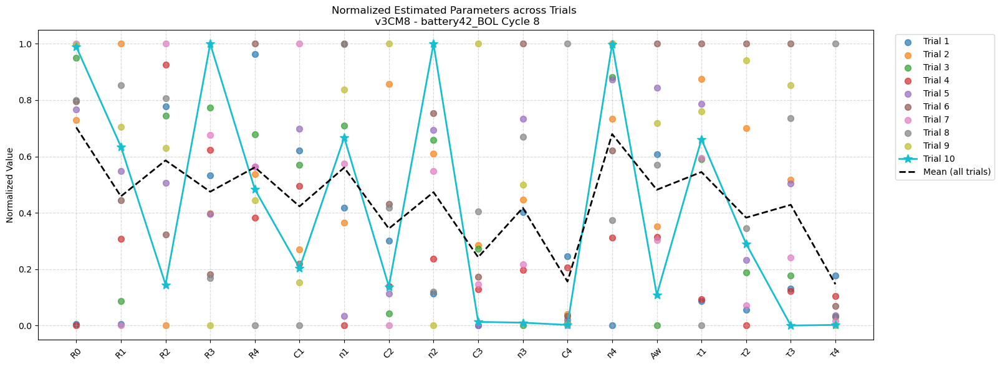

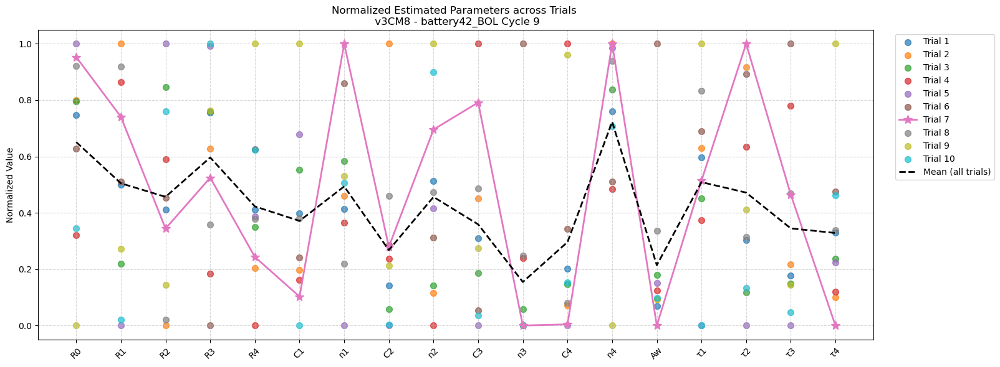

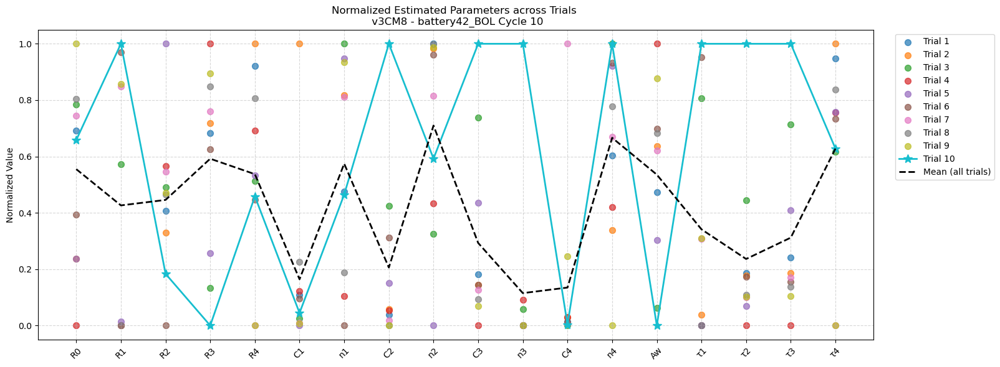

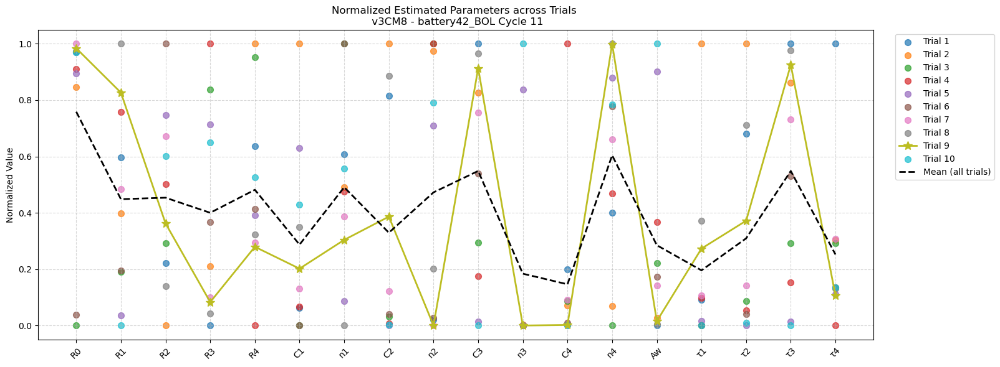

In [19]:
## V3Cm8
import pandas as pd
import ast
import numpy as np
import matplotlib.pyplot as plt

target_battery = "battery42_BOL"
target_ECM = "v3CM8"


for cycle in all_battery_data[target_battery].keys():
    # Load and parse
    df = pd.read_csv(f'trial_results_10/objFunc_RMSE_abs/{target_battery}_cycle{cycle}_trials10_objFunc_RMSE_abs_{target_ECM}.csv')
    df['estimated_params'] = df['estimated_params'].apply(ast.literal_eval)

    # Parameter names
    param_names = ['R0', 'R1', 'R2', 'R3', 'R4', 
                'C1', 'n1', 'C2', 'n2', 'C3', 'n3', 'C4', 'n4', 'Aw']

    # Convert to matrix
    param_matrix = np.array(df['estimated_params'].tolist())

    # Compute time constants τ1–τ4
    taus = []
    for row in param_matrix:
        tau = []
        for i in range(4):
            R = row[1 + i]              # R1–R4: index 1–4
            C = row[5 + i*2]            # C1–C4: index 5,7,9,11
            n = row[6 + i*2]            # n1–n4: index 6,8,10,12
            tau_val = (R * C) ** (1 / n) if n > 0 else np.nan
            tau.append(tau_val)
        taus.append(tau)

    taus = np.array(taus)

    # Combine for normalization
    combined_matrix = np.hstack([param_matrix, taus])
    combined_min = combined_matrix.min(axis=0)
    combined_max = combined_matrix.max(axis=0)
    combined_norm = (combined_matrix - combined_min) / (combined_max - combined_min)

    mean_vals = combined_norm.mean(axis=0)
    # Labels
    tau_names = ['τ1', 'τ2', 'τ3', 'τ4']
    x_labels = param_names + tau_names

    # Plotting
    plt.figure(figsize=(16, 6))

    # Assign a unique color per trial
    colors = plt.cm.tab10(np.linspace(0, 1, len(df)))  # or use another colormap

    for i, (index, row) in enumerate(df.iterrows()):
        y_vals = combined_norm[i]
        label = f"Trial {row['trial_id']}"
        
        if row['is_best']:
            plt.plot(x_labels, y_vals, label=label, 
                        color=colors[i], marker='*', markersize = 10, linestyle='solid', linewidth=2)
        else:
            plt.scatter(x_labels, y_vals, label=label, 
                        color=colors[i], marker='o', s=50, alpha=0.7)
    plt.plot(x_labels, mean_vals, linestyle='--', color='black', linewidth=2, label='Mean (all trials)', zorder=2)
    plt.xticks(rotation=45)
    plt.ylabel('Normalized Value')
    plt.title(f'Normalized Estimated Parameters across Trials \n {target_ECM} - {target_battery} Cycle {cycle}')
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.legend(loc='upper right', bbox_to_anchor=(1.15, 1))
    plt.tight_layout()
    plt.show()


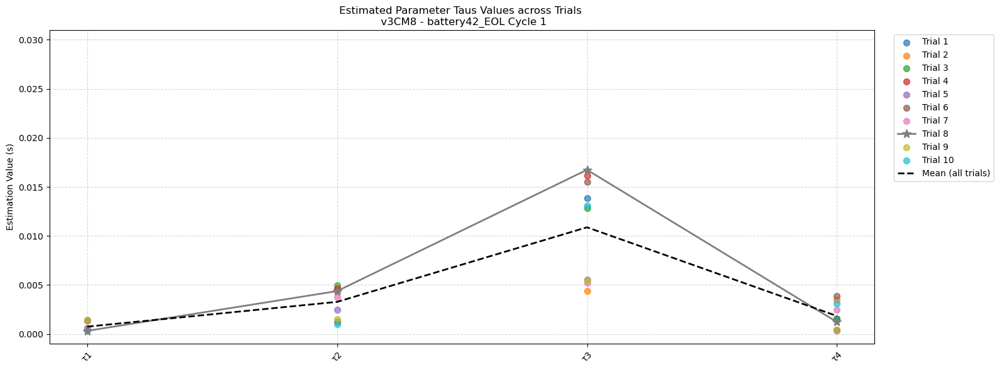

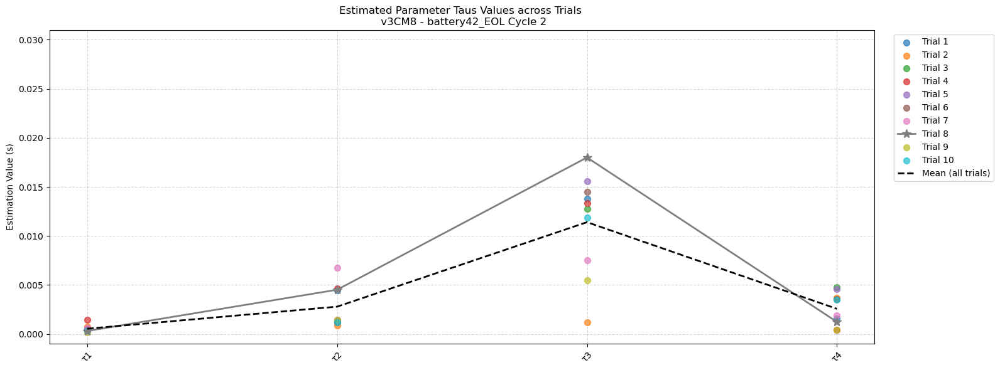

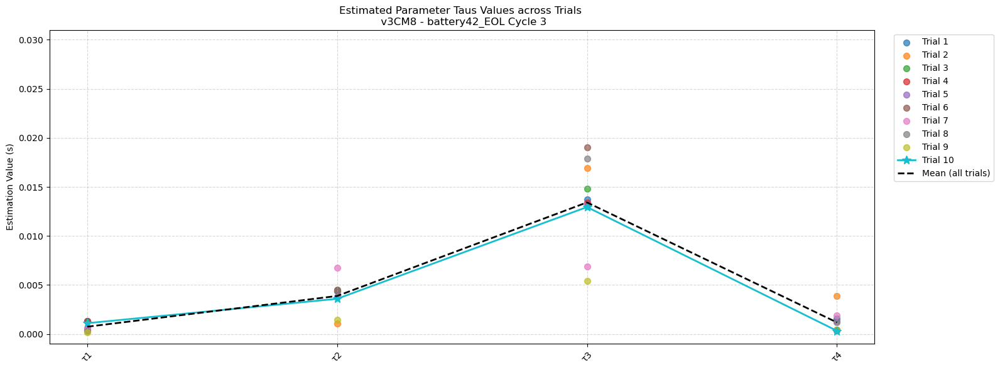

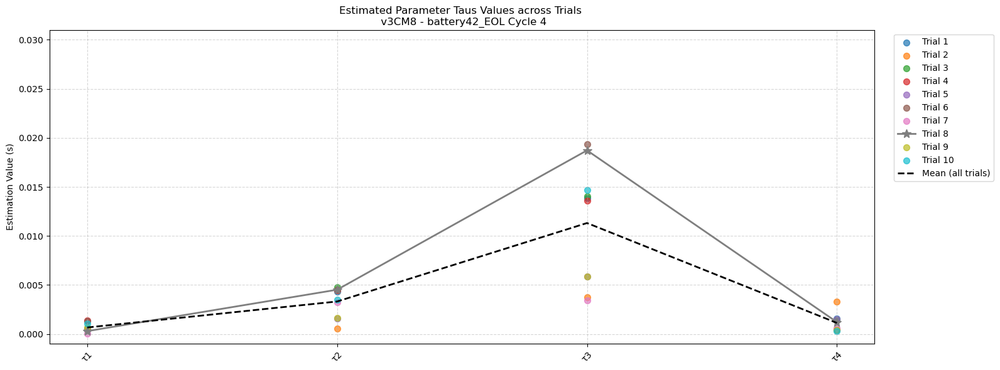

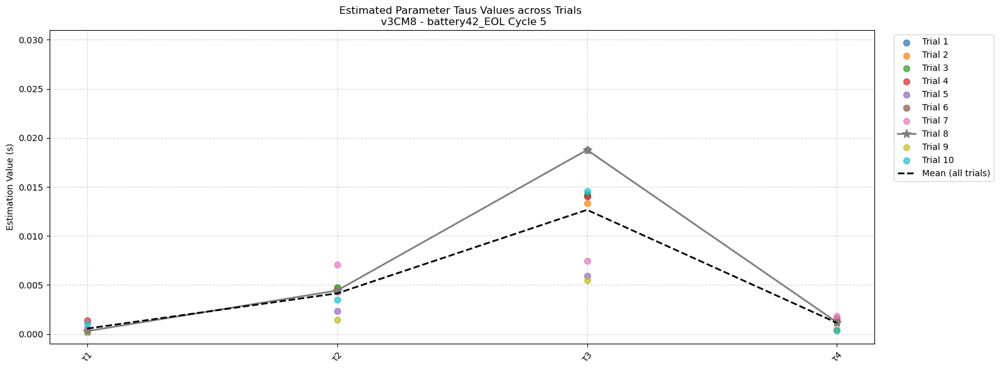

...

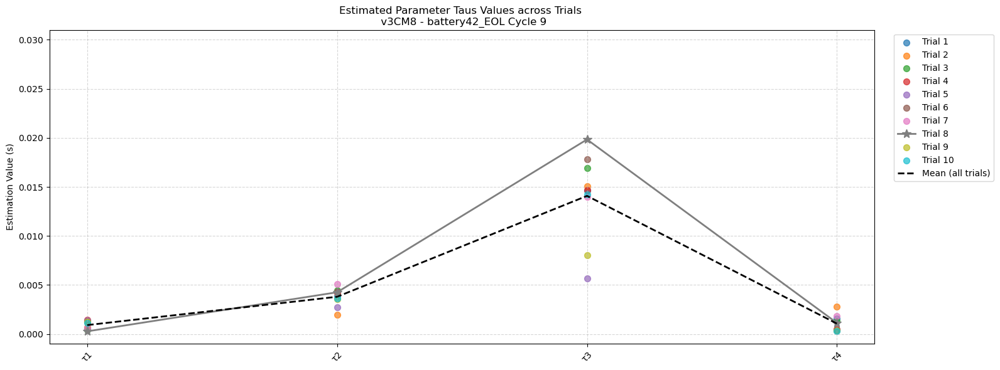

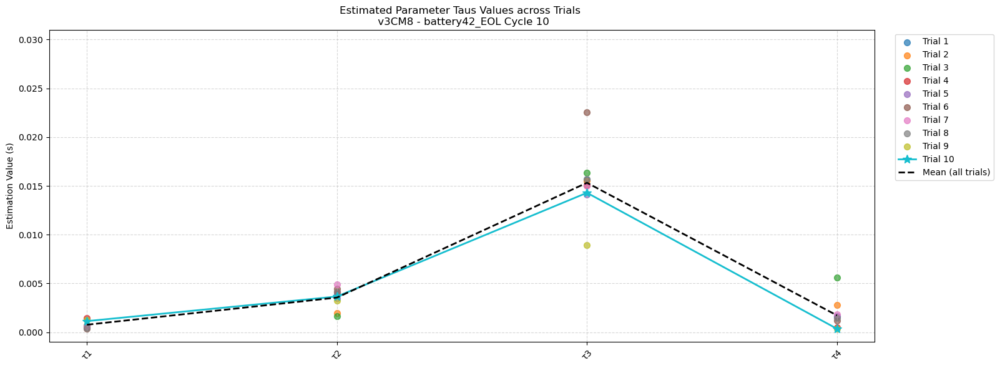

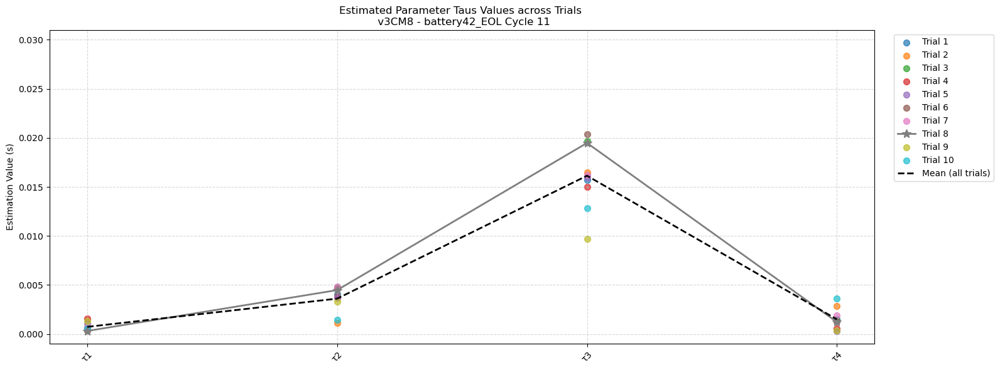

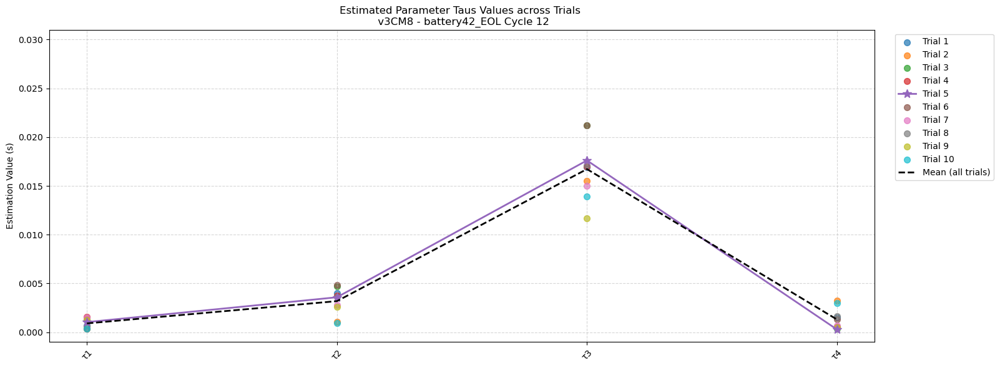

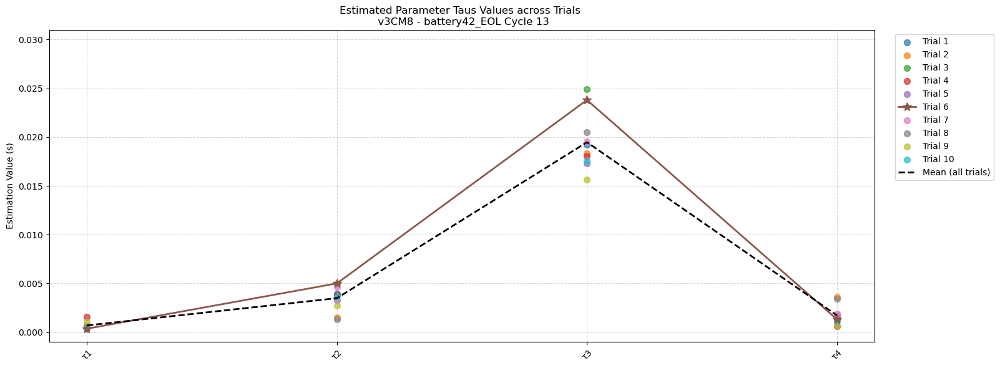

In [20]:
## V3Cm8
import pandas as pd
import ast
import numpy as np
import matplotlib.pyplot as plt

target_battery = "battery42_EOL"
target_ECM = "v3CM8"


for cycle in all_battery_data[target_battery].keys():
    # Load and parse
    df = pd.read_csv(f'trial_results_10/objFunc_RMSE_abs/{target_battery}_cycle{cycle}_trials10_objFunc_RMSE_abs_{target_ECM}.csv')
    df['estimated_params'] = df['estimated_params'].apply(ast.literal_eval)

    # Parameter names
    param_names = ['R0', 'R1', 'R2', 'R3', 'R4', 
                'C1', 'n1', 'C2', 'n2', 'C3', 'n3', 'C4', 'n4', 'Aw']

    # Convert to matrix
    param_matrix = np.array(df['estimated_params'].tolist())

    # Compute time constants τ1–τ4
    taus = []
    for row in param_matrix:
        tau = []
        for i in range(4):
            R = row[1 + i]              # R1–R4: index 1–4
            C = row[5 + i*2]            # C1–C4: index 5,7,9,11
            n = row[6 + i*2]            # n1–n4: index 6,8,10,12
            tau_val = (R * C) ** (1 / n) if n > 0 else np.nan
            tau.append(tau_val)
        taus.append(tau)

    taus = np.array(taus)

    # Combine for normalization
    combined_matrix = np.hstack([param_matrix, taus])
    plot_matrix = taus

    mean_vals = plot_matrix.mean(axis=0)
    # Labels
    tau_names = ['τ1', 'τ2', 'τ3', 'τ4']
    # x_labels = param_names[0:5]
    x_labels = tau_names

    # Plotting
    plt.figure(figsize=(16, 6))

    # Assign a unique color per trial
    colors = plt.cm.tab10(np.linspace(0, 1, len(df)))  # or use another colormap

    for i, (index, row) in enumerate(df.iterrows()):
        y_vals = plot_matrix[i]
        label = f"Trial {row['trial_id']}"
        
        if row['is_best']:
            plt.plot(x_labels, y_vals, label=label, 
                        color=colors[i], marker='*', markersize = 10, linestyle='solid', linewidth=2)
        else:
            plt.scatter(x_labels, y_vals, label=label, 
                        color=colors[i], marker='o', s=50, alpha=0.7)
    plt.plot(x_labels, mean_vals, linestyle='--', color='black', linewidth=2, label='Mean (all trials)', zorder=2)
    plt.xticks(rotation=45)
    plt.ylabel('Estimation Value (s)')
    plt.title(f'Estimated Parameter Taus Values across Trials \n {target_ECM} - {target_battery} Cycle {cycle}')
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.legend(loc='upper right', bbox_to_anchor=(1.15, 1))
    plt.tight_layout()
    plt.ylim(-0.001, 0.031)
    plt.show()

### Version2: marker as trial_id sorted 

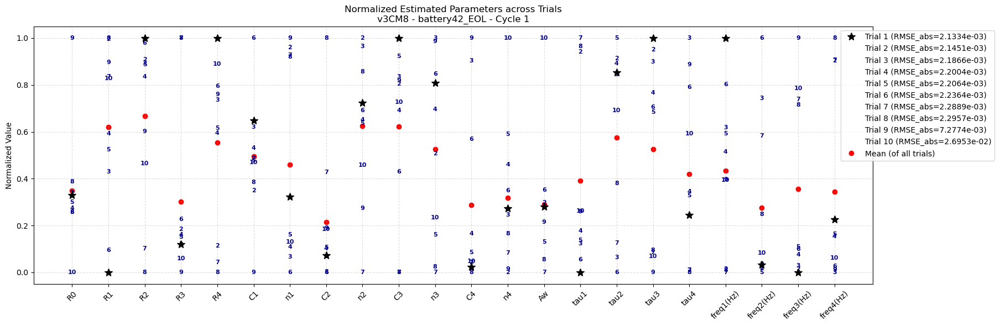

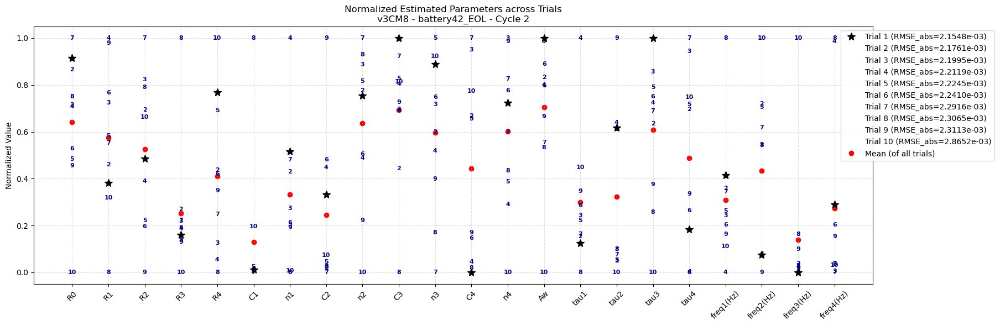

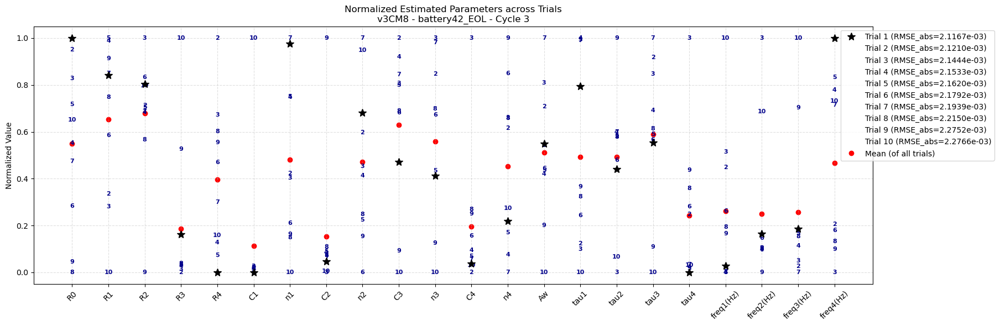

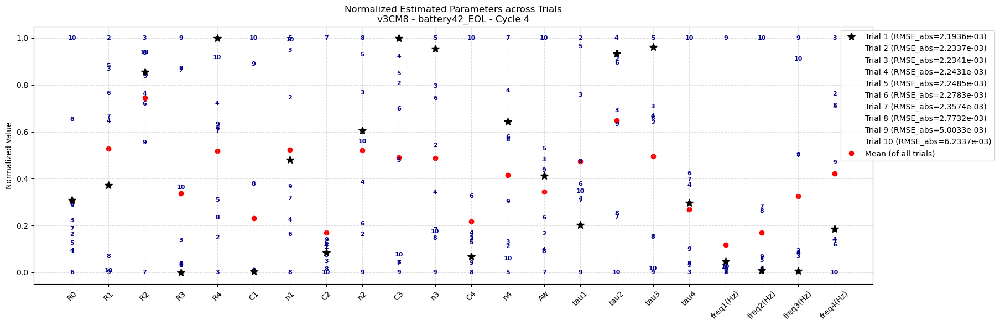

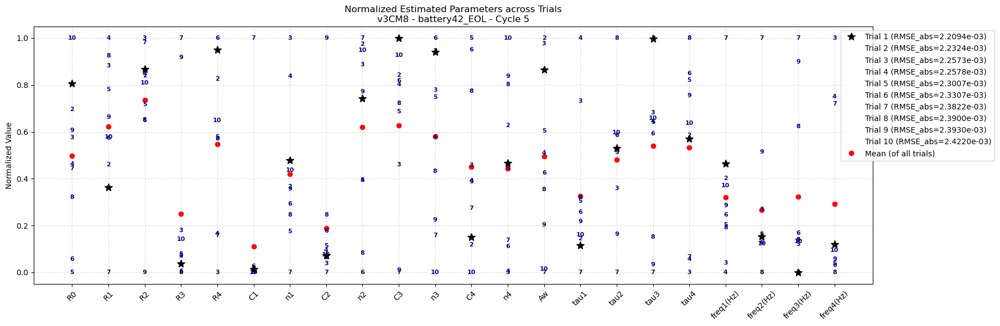

...

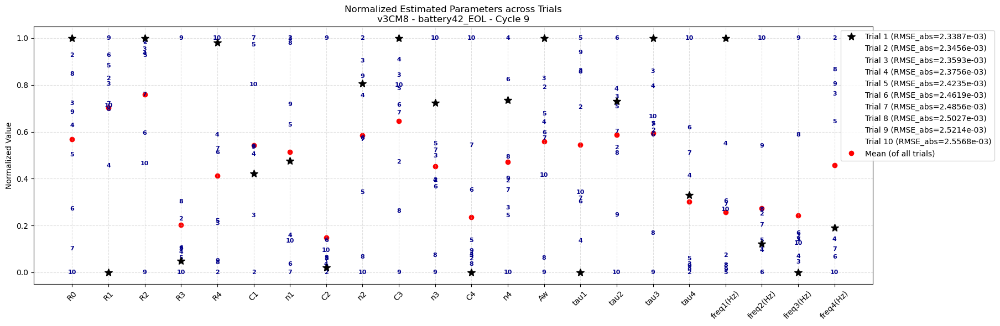

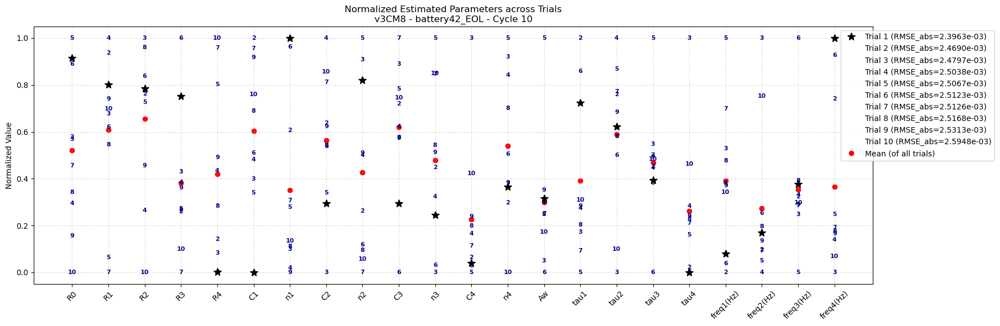

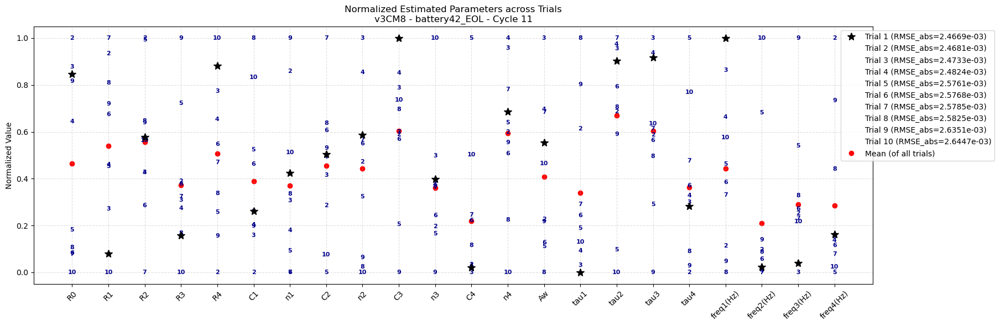

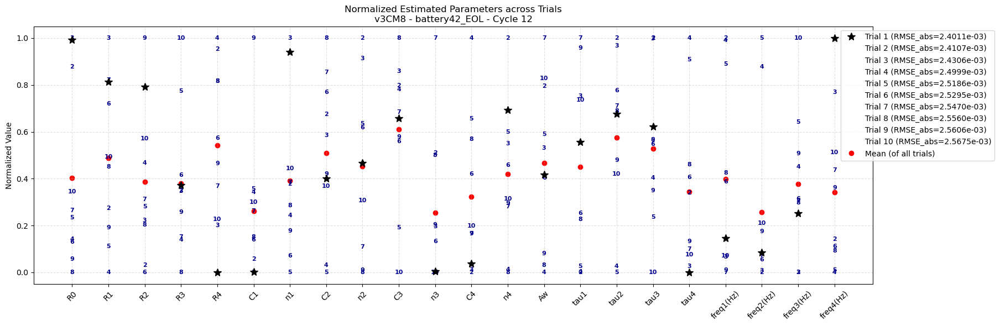

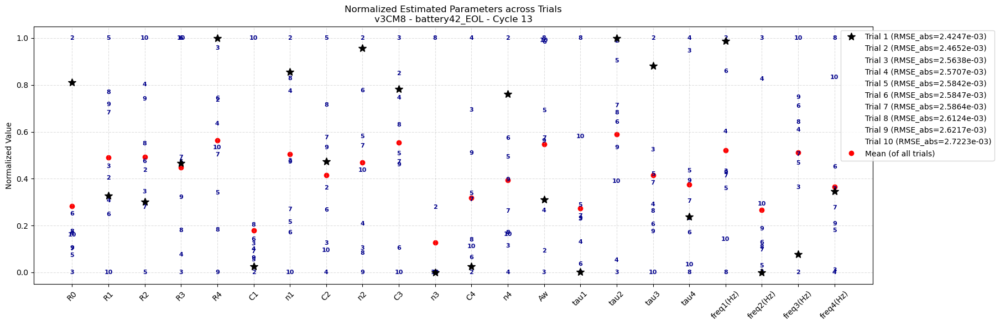

In [22]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# === CONFIG ===
csv_path = "trial_results_10/objFunc_RMSE_abs/Sorted_battery42_v3CM8_RMSE_abs.csv"
target_battery = "battery42_EOL"
target_ECM = "v3CM8"

# === LOAD DATA ===
df = pd.read_csv(csv_path)

# === FILTER SPECIFIC CYCLE (optional: loop over all if needed) ===
for cycle in all_battery_data[target_battery].keys():
    df_cycle = df[(df['Battery_Name'] + "_" + df['SOH'] == target_battery) & (df['Cycle'] == cycle)].copy()
    
    # === PARAMETER COLUMNS ===
    param_names = ['R0', 'R1', 'R2', 'R3', 'R4',
                   'C1', 'n1', 'C2', 'n2', 'C3', 'n3', 'C4', 'n4', 'Aw',
                   'tau1', 'tau2', 'tau3', 'tau4',
                   'freq1(Hz)', 'freq2(Hz)', 'freq3(Hz)', 'freq4(Hz)']
    
    # === Normalization ===
    param_matrix = df_cycle[param_names].values
    param_min = np.min(param_matrix, axis=0)
    param_max = np.max(param_matrix, axis=0)
    range_vals = param_max - param_min
    range_vals[range_vals == 0] = 1.0  # avoid divide-by-zero
    norm_matrix = (param_matrix - param_min) / range_vals
    mean_vals = norm_matrix.mean(axis=0)

    # === Plot ===
    plt.figure(figsize=(18, 6))

    x_labels = param_names
    x_pos = np.arange(len(x_labels))

    for i, (_, row) in enumerate(df_cycle.iterrows()):
        norm_vals = norm_matrix[i]
        trial_id = int(row['Trial_ID'])
        rsse = row['RMSE_abs']

        # Label for legend
        legend_label = f"Trial {trial_id} (RMSE_abs={rsse:.4e})"

        if trial_id == 1:
            # Best trial
            plt.plot(x_labels, norm_vals, label=legend_label,
                     linestyle='none', color='black', marker='*', linewidth=2, markersize=10, zorder=3)
        else:
            # Use Trial_ID as marker number
            marker_text = str(trial_id)
            for xi, yi in zip(x_pos, norm_vals):
                plt.text(xi, yi, marker_text, ha='center', va='center',
                         fontsize=8, fontweight='bold', color='darkblue', zorder=2)
            plt.plot(x_labels, norm_vals, label=legend_label, color='gray', alpha=0.5, linestyle='none')

    # === Mean line ===
    plt.plot(x_labels, mean_vals, marker='o', color='red', label='Mean (of all trials)', zorder=1, linestyle = 'none')

    # === Final Touches ===
    plt.xticks(rotation=45)
    plt.ylabel('Normalized Value')
    plt.title(f'Normalized Estimated Parameters across Trials\n{target_ECM} - {target_battery} - Cycle {cycle}')
    plt.grid(True, linestyle='--', alpha=0.4)
    plt.legend(loc='upper right', bbox_to_anchor=(1.15, 1))
    plt.tight_layout()
    plt.show()


## Time Constant Value across Trials (Tau value vs. Trial ID) -- CM8

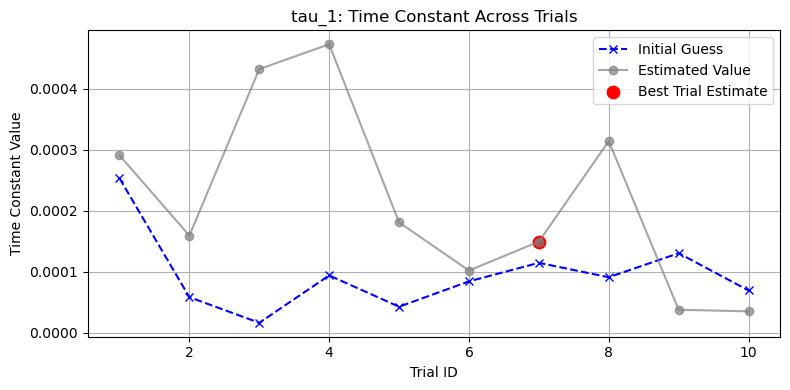

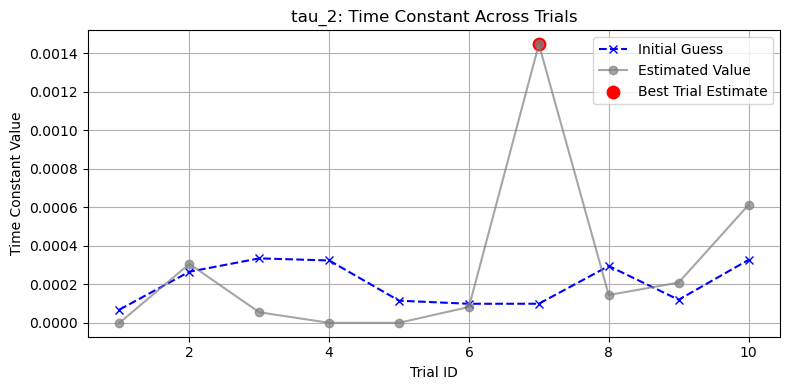

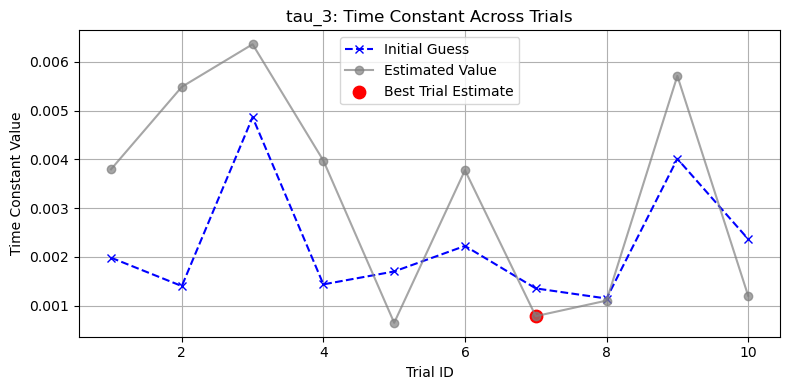

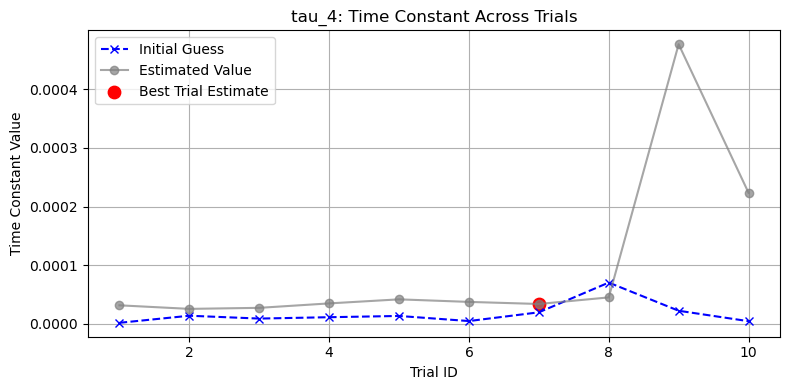

In [ ]:
# import pandas as pd
# import ast
# import matplotlib.pyplot as plt

# # Load and parse
# df = pd.read_csv('trial_results_10/objFunc_RSSE/battery42_BOL_cycle1_trials10_objFunc_RSSE_v3CM8.csv')
# df['estimated_params'] = df['estimated_params'].apply(ast.literal_eval)
# df['initial_guess'] = df['initial_guess'].apply(ast.literal_eval)

# # Define parameter names
# param_names = ['R0', 'R1', 'R2', 'R3', 'R4', 
#                'C1', 'n1', 'C2', 'n2', 'C3', 'n3', 'C4', 'n4', 'Aw']
# n_params = len(param_names)

# # Build full DataFrame with trial info
# tau_records = []

# for i, row in df.iterrows():
#     trial_id = row['trial_id']
#     is_best = row['is_best']
    
#     est = row['estimated_params']
#     init = row['initial_guess']
    
#     # For each RC pair (indexing from 1 to 4)
#     for idx in range(4):
#         R = est[idx]       # R1–R4 = est[0–3]
#         C = est[5 + idx*2] # C1–C4 = est[5, 7, 9, 11]
#         n = est[6 + idx*2] # n1–n4 = est[6, 8, 10, 12]
        
#         R0 = init[idx]
#         C0 = init[5 + idx*2]
#         n0 = init[6 + idx*2]
        
#         # Compute time constants
#         tau_est = (R * C) ** (1 / n)
#         tau_init = (R0 * C0) ** (1 / n0)
        
#         tau_records.append({
#             'trial_id': trial_id,
#             'pair': f'tau_{idx+1}',
#             'tau_est': tau_est,
#             'tau_init': tau_init,
#             'is_best': is_best
#         })

# df_tau = pd.DataFrame(tau_records)

# import matplotlib.pyplot as plt

# for tau in ['tau_1', 'tau_2', 'tau_3', 'tau_4']:
#     subset = df_tau[df_tau['pair'] == tau]
    
#     plt.figure(figsize=(8, 4))
    
#     # Initial guess line
#     plt.plot(subset['trial_id'], subset['tau_init'],
#              linestyle='--', marker='x', color='blue', label='Initial Guess')
    
#     # Estimated value line
#     plt.plot(subset['trial_id'], subset['tau_est'],
#              linestyle='-', marker='o', color='gray', label='Estimated Value', alpha=0.7)
    
#     # Highlight best trial
#     best_row = subset[subset['is_best']]
#     if not best_row.empty:
#         plt.scatter(best_row['trial_id'], best_row['tau_est'],
#                     color='red', s=80, label='Best Trial Estimate')
    
#     plt.title(f"{tau}: Time Constant Across Trials")
#     plt.xlabel("Trial ID")
#     plt.ylabel("Time Constant Value")
#     plt.legend()
#     plt.grid(True)
#     plt.tight_layout()
#     plt.show()


## Normalized per-parameter across trials plots -- CM7

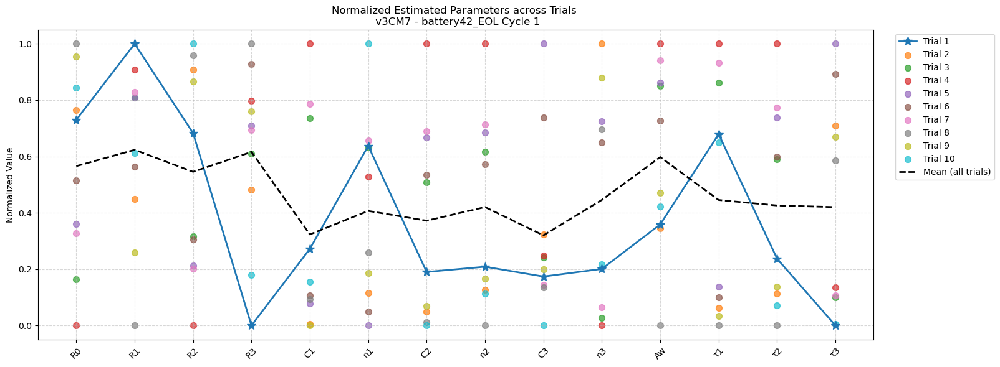

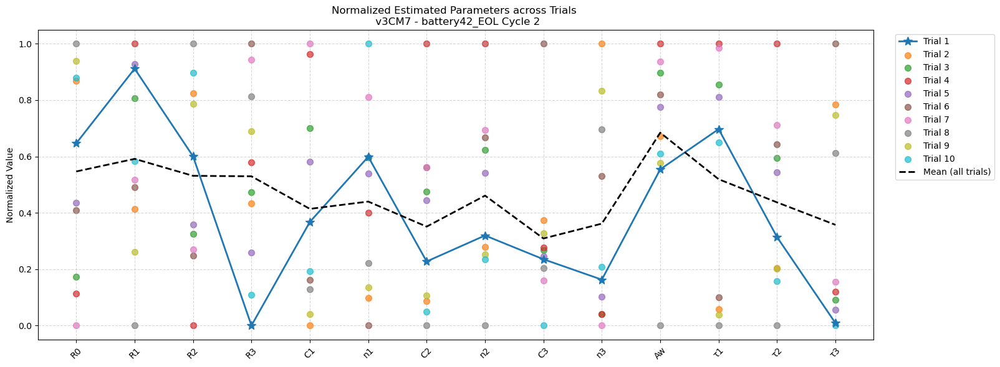

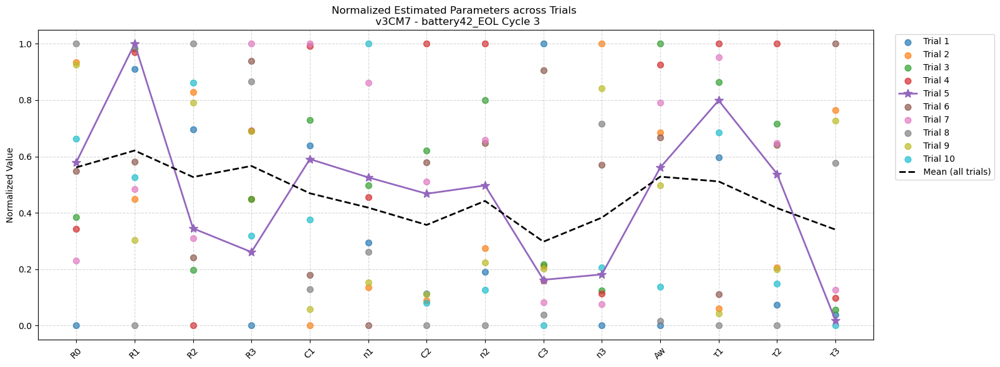

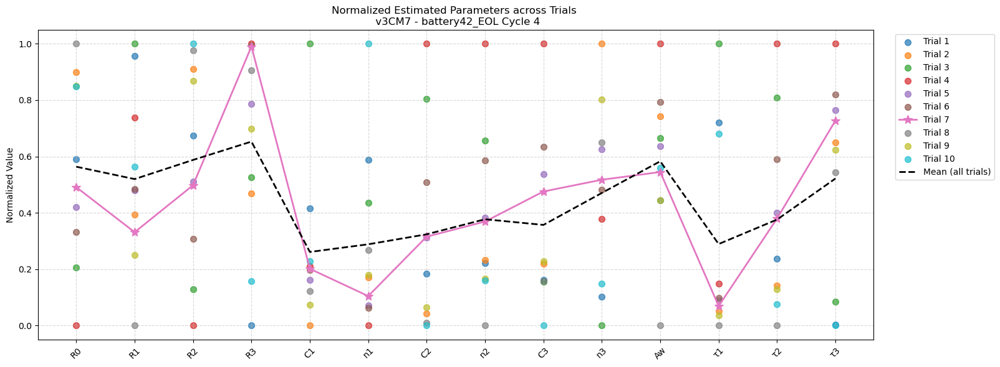

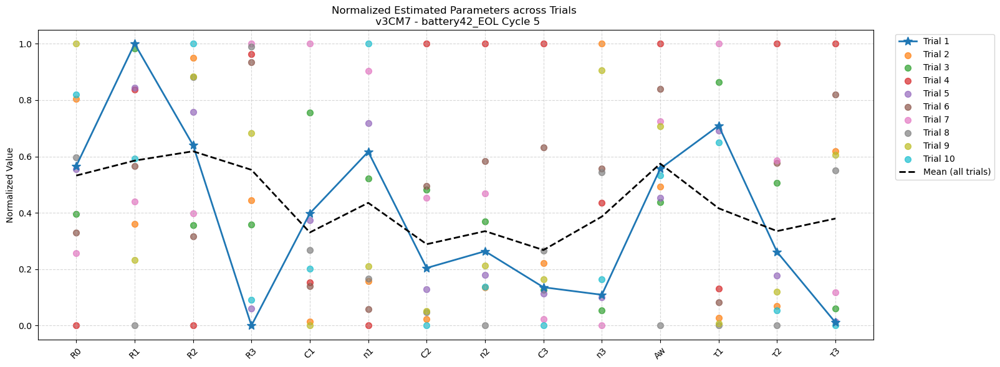

...

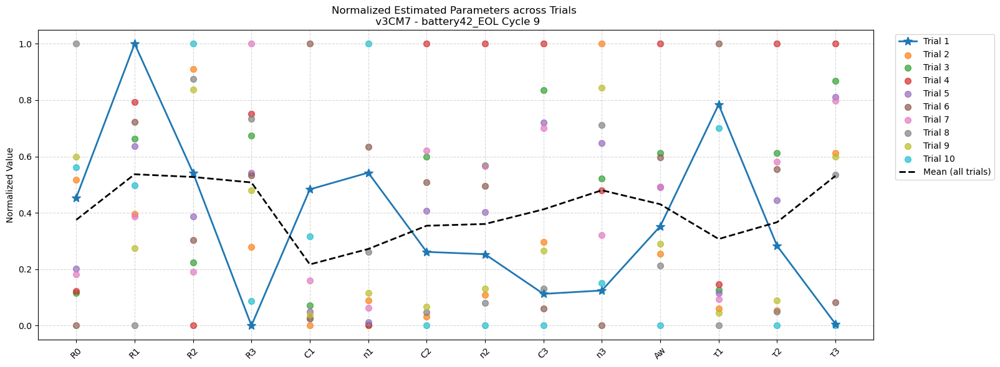

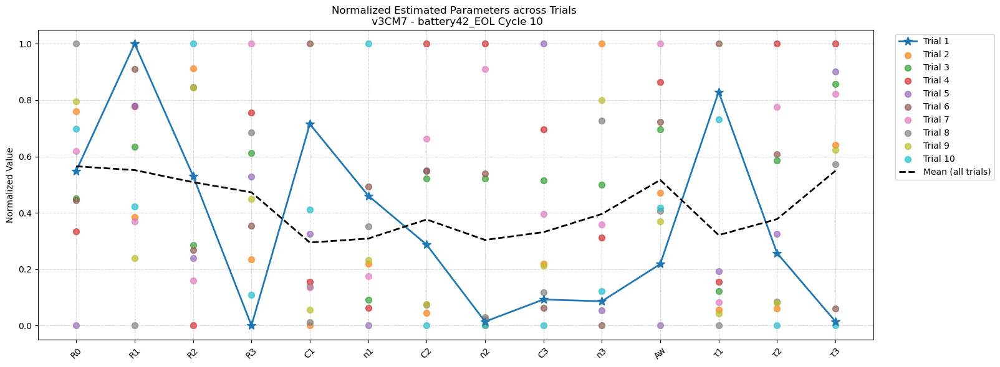

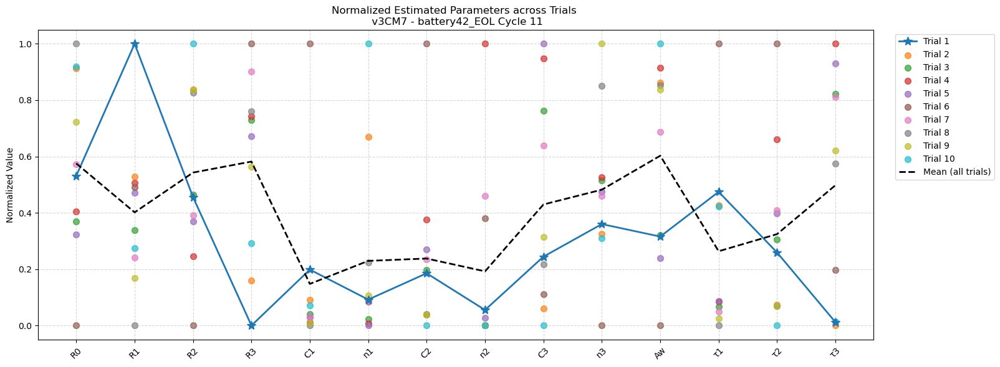

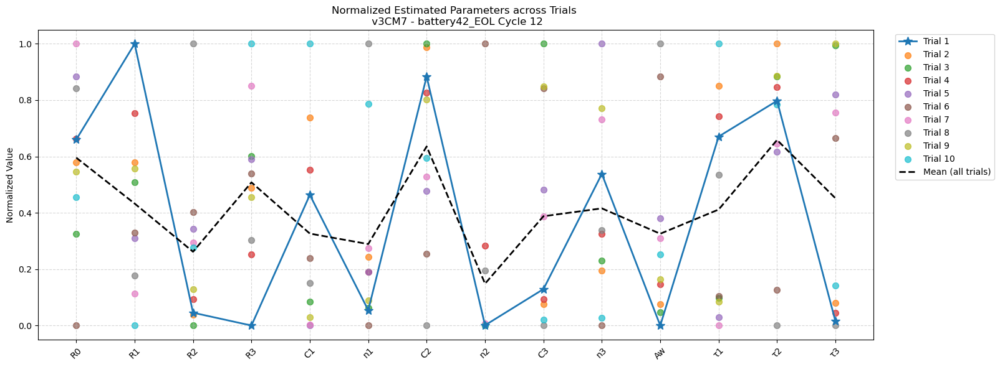

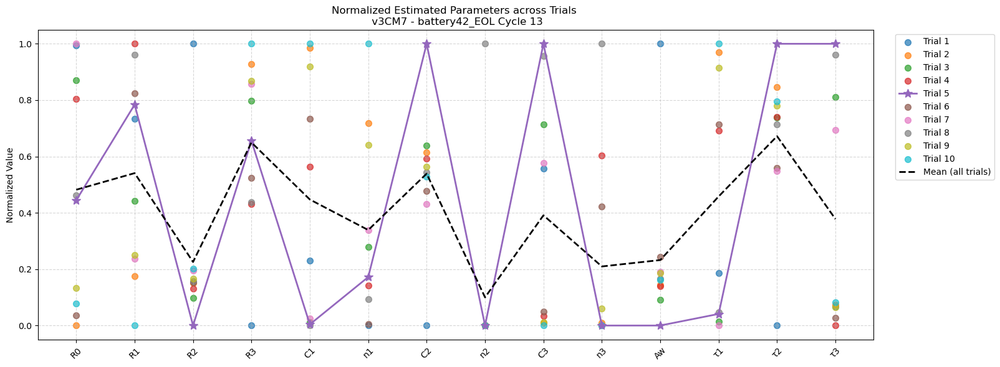

In [23]:
## V3CM7
import pandas as pd
import ast
import numpy as np
import matplotlib.pyplot as plt

target_battery = "battery42_EOL"
target_ECM = "v3CM7"


for cycle in all_battery_data[target_battery].keys():
    # Load and parse
    df = pd.read_csv(f'trial_results_10/objFunc_RMSE_abs/{target_battery}_cycle{cycle}_trials10_objFunc_RMSE_abs_{target_ECM}.csv')
    df['estimated_params'] = df['estimated_params'].apply(ast.literal_eval)

    # Parameter names
    param_names = ['R0', 'R1', 'R2', 'R3',  
                'C1', 'n1', 'C2', 'n2', 'C3', 'n3', 'Aw']

    # Convert to matrix
    param_matrix = np.array(df['estimated_params'].tolist())

    # Compute time constants τ1–τ3
    taus = []
    for row in param_matrix:
        tau = []
        for i in range(3):
            R = row[1 + i]              # R1–R3: index 1–3
            C = row[4 + i*2]            # C1–C3: index 4,6,8
            n = row[5 + i*2]            # n1–n4: index 5,7,9
            tau_val = (R * C) ** (1 / n) if n > 0 else np.nan
            tau.append(tau_val)
        taus.append(tau)

    taus = np.array(taus)

    # Combine for normalization
    combined_matrix = np.hstack([param_matrix, taus])
    combined_min = combined_matrix.min(axis=0)
    combined_max = combined_matrix.max(axis=0)
    range_vals = combined_max - combined_min
    # Avoid divide-by-zero by replacing 0 with 1 (will result in 0 for all normalized entries)
    range_vals[range_vals == 0] = 1.0
    combined_norm = (combined_matrix - combined_min) / range_vals

    mean_vals = combined_norm.mean(axis=0)
    # Labels
    tau_names = ['τ1', 'τ2', 'τ3']
    x_labels = param_names + tau_names

    # Plotting
    plt.figure(figsize=(16, 6))

    # Assign a unique color per trial
    colors = plt.cm.tab10(np.linspace(0, 1, len(df)))  # or use another colormap

    for i, (index, row) in enumerate(df.iterrows()):
        y_vals = combined_norm[i]
        label = f"Trial {row['trial_id']}"
        
        if row['is_best']:
            plt.plot(x_labels, y_vals, label=label, 
                        color=colors[i], marker='*', markersize = 10, linestyle='solid', linewidth=2)
        else:
            plt.scatter(x_labels, y_vals, label=label, 
                        color=colors[i], marker='o', s=50, alpha=0.7)
    plt.plot(x_labels, mean_vals, linestyle='--', color='black', linewidth=2, label='Mean (all trials)', zorder=2)
    plt.xticks(rotation=45)
    plt.ylabel('Normalized Value')
    plt.title(f'Normalized Estimated Parameters across Trials \n {target_ECM} - {target_battery} Cycle {cycle}')
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.legend(loc='upper right', bbox_to_anchor=(1.15, 1))
    plt.tight_layout()
    plt.show()


### Version2: marker as trial_id sorted 

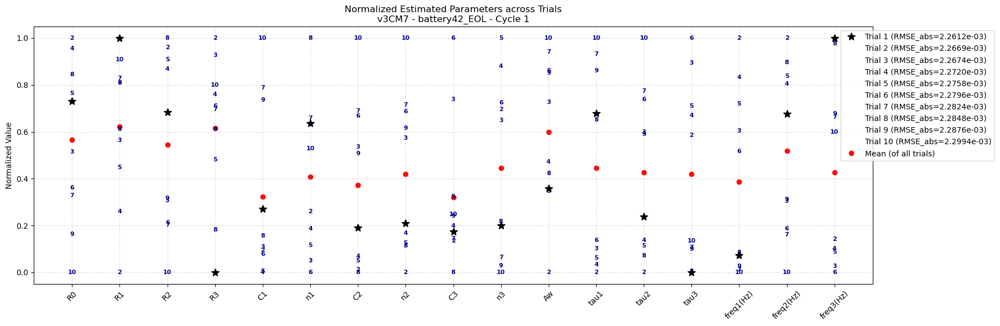

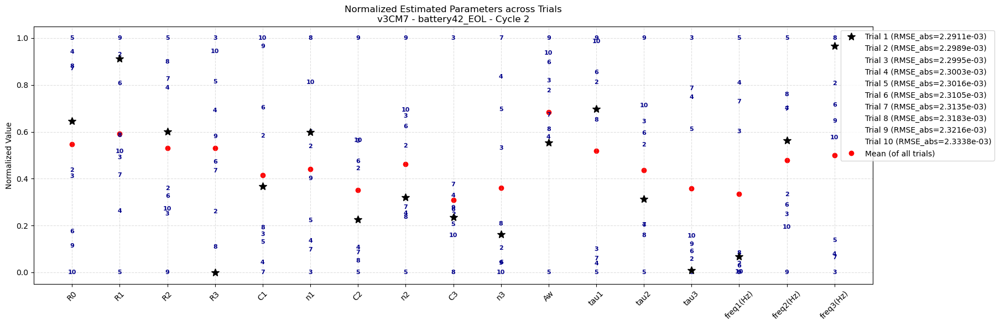

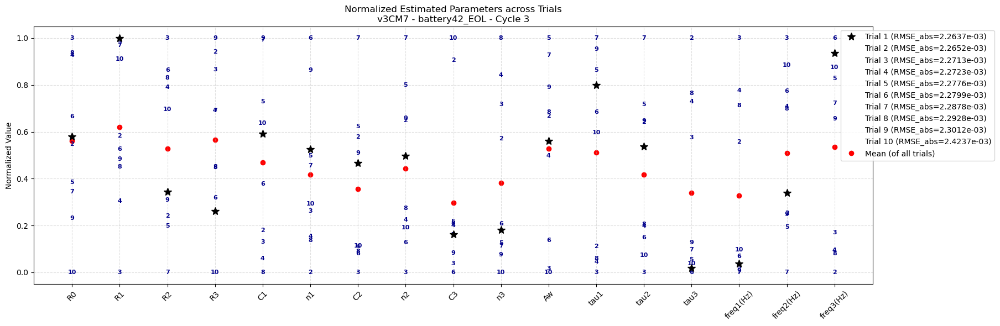

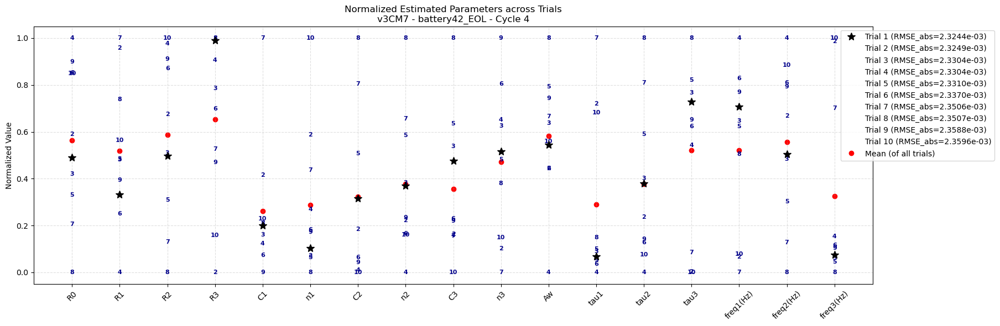

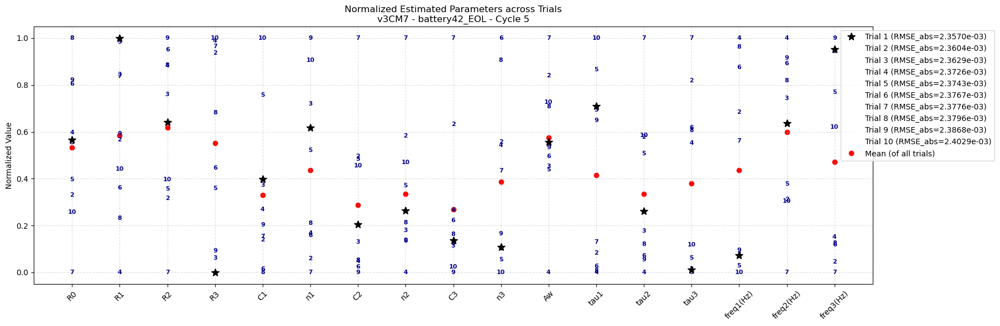

...

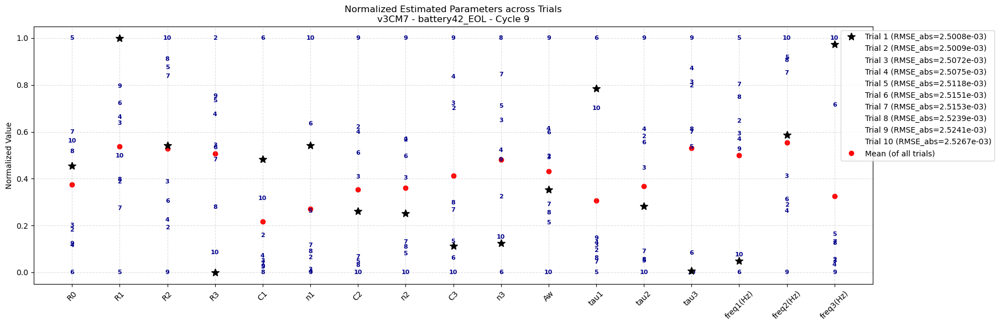

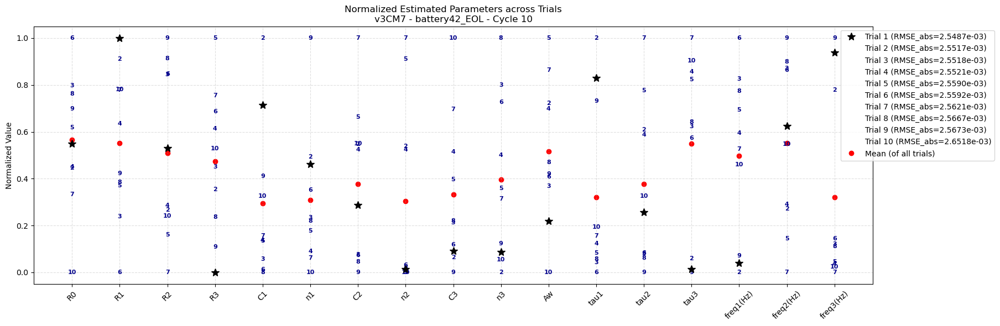

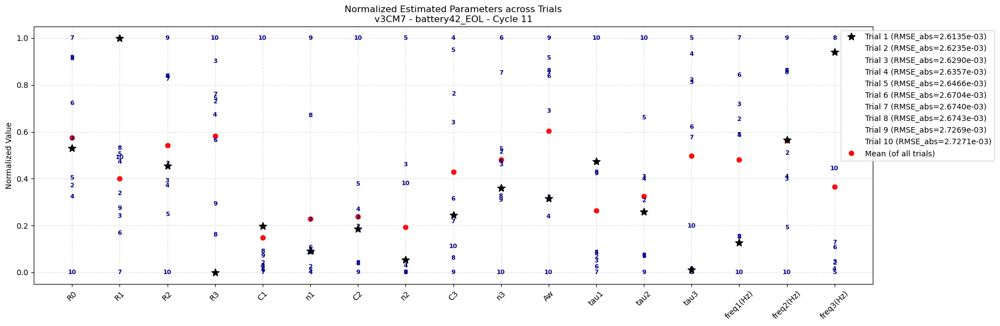

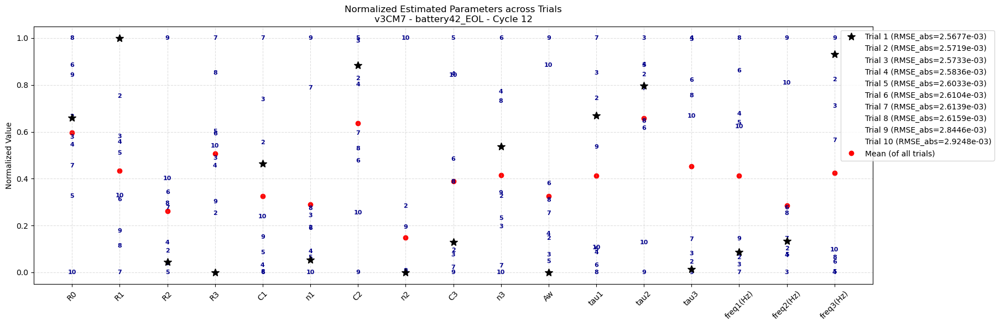

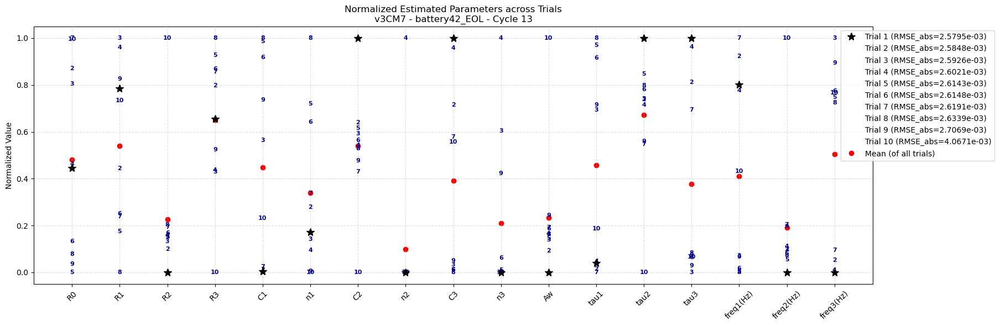

In [24]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# === CONFIG ===
csv_path = "trial_results_10/objFunc_RMSE_abs/Sorted_battery42_v3CM7_RMSE_abs.csv"
target_battery = "battery42_EOL"
target_ECM = "v3CM7"

# === LOAD DATA ===
df = pd.read_csv(csv_path)

# === FILTER SPECIFIC CYCLE (optional: loop over all if needed) ===
for cycle in all_battery_data[target_battery].keys():
    df_cycle = df[(df['Battery_Name'] + "_" + df['SOH'] == target_battery) & (df['Cycle'] == cycle)].copy()
    
    # === PARAMETER COLUMNS ===
    param_names = ['R0', 'R1', 'R2', 'R3',
                   'C1', 'n1', 'C2', 'n2', 'C3', 'n3', 'Aw',
                   'tau1', 'tau2', 'tau3',
                   'freq1(Hz)', 'freq2(Hz)', 'freq3(Hz)']
    
    # === Normalization ===
    param_matrix = df_cycle[param_names].values
    param_min = np.min(param_matrix, axis=0)
    param_max = np.max(param_matrix, axis=0)
    range_vals = param_max - param_min
    range_vals[range_vals == 0] = 1.0  # avoid divide-by-zero
    norm_matrix = (param_matrix - param_min) / range_vals
    mean_vals = norm_matrix.mean(axis=0)

    # === Plot ===
    plt.figure(figsize=(18, 6))

    x_labels = param_names
    x_pos = np.arange(len(x_labels))

    for i, (_, row) in enumerate(df_cycle.iterrows()):
        norm_vals = norm_matrix[i]
        trial_id = int(row['Trial_ID'])
        rsse = row['RMSE_abs']

        # Label for legend
        legend_label = f"Trial {trial_id} (RMSE_abs={rsse:.4e})"

        if trial_id == 1:
            # Best trial
            plt.plot(x_labels, norm_vals, label=legend_label,
                     linestyle='none', color='black', marker='*', linewidth=2, markersize=10, zorder=3)
        else:
            # Use Trial_ID as marker number
            marker_text = str(trial_id)
            for xi, yi in zip(x_pos, norm_vals):
                plt.text(xi, yi, marker_text, ha='center', va='center',
                         fontsize=8, fontweight='bold', color='darkblue', zorder=2)
            plt.plot(x_labels, norm_vals, label=legend_label, color='gray', alpha=0.5, linestyle='none')

    # === Mean line ===
    plt.plot(x_labels, mean_vals, marker='o', color='red', label='Mean (of all trials)', zorder=1, linestyle = 'none')

    # === Final Touches ===
    plt.xticks(rotation=45)
    plt.ylabel('Normalized Value')
    plt.title(f'Normalized Estimated Parameters across Trials\n{target_ECM} - {target_battery} - Cycle {cycle}')
    plt.grid(True, linestyle='--', alpha=0.4)
    plt.legend(loc='upper right', bbox_to_anchor=(1.15, 1))
    plt.tight_layout()
    plt.show()


In [25]:
cycle_summary_list = []
param_corr_list = []

# === Run after all cycles processed ===
for cycle in sorted(df['Cycle'].unique()):
    df_cycle = df[(df['Battery_Name'] + "_" + df['SOH'] == target_battery) & (df['Cycle'] == cycle)].copy()

    # === Cycle Summary ===
    best_row = df_cycle.iloc[0]
    worst_row = df_cycle.iloc[-1]
    row_summary = {
        "Cycle": cycle,
        "Best_Trial_ID": int(best_row['Trial_ID']),
        "Best_RMSE_abs": best_row['RMSE_abs'],
        "Worst_Trial_ID": int(worst_row['Trial_ID']),
        "Worst_RMSE_abs": worst_row['RMSE_abs'],
        "Mean_RMSE_abs": df_cycle['RMSE_abs'].mean(),
        "Mean_tau1": df_cycle['tau1'].mean(),
        "Mean_tau2": df_cycle['tau2'].mean(),
        "Mean_tau3": df_cycle['tau3'].mean(),
        "Mean_freq1": df_cycle['freq1(Hz)'].mean(),
        "Mean_freq2": df_cycle['freq2(Hz)'].mean(),
        "Mean_freq3": df_cycle['freq3(Hz)'].mean()
    }
    cycle_summary_list.append(row_summary)

    # === Correlation Summary ===
    # Normalize parameters for correlation
    param_names = ['R0', 'R1', 'R2', 'R3',
                   'C1', 'n1', 'C2', 'n2', 'C3', 'n3', 'Aw',
                   'tau1', 'tau2', 'tau3',
                   'freq1(Hz)', 'freq2(Hz)', 'freq3(Hz)']

    norm_df = df_cycle[param_names].copy()
    norm_df = (norm_df - norm_df.min()) / (norm_df.max() - norm_df.min())
    norm_df['Trial_ID'] = df_cycle['Trial_ID']

    # Correlation of each parameter with Trial_ID
    param_corr = norm_df.corr(numeric_only=True)['Trial_ID'].drop('Trial_ID')
    param_corr_list.append(param_corr.rename(f"Cycle {cycle}"))

In [26]:
# === 1. Cycle Summary Table ===
cycle_summary_df = pd.DataFrame(cycle_summary_list)
print("\n=== Cycle Summary ===")
print(cycle_summary_df.round(4))

# Optionally save:
# cycle_summary_df.to_csv(f"{target_battery}_{target_ECM}_cycle_summary.csv", index=False)

# === 2. Parameter-Trail_ID Correlation Table ===
param_corr_df = pd.DataFrame(param_corr_list)
print("\n=== Parameter-to-Trial_ID Correlations ===")
print(param_corr_df.round(3))

# Optionally save:
# param_corr_df.to_csv(f"{target_battery}_{target_ECM}_param_correlation_summary.csv")



=== Cycle Summary ===
    Cycle  Best_Trial_ID  Best_RMSE_abs  Worst_Trial_ID  Worst_RMSE_abs  \
0       1              1         0.0023              10          0.0023   
1       2              1         0.0023              10          0.0023   
2       3              1         0.0023              10          0.0024   
3       4              1         0.0023              10          0.0024   
4       5              1         0.0024              10          0.0024   
5       6              1         0.0024              10          0.0024   
6       7              1         0.0025              10          0.0025   
7       8              1         0.0025              10          0.0025   
8       9              1         0.0025              10          0.0025   
9      10              1         0.0025              10          0.0027   
10     11              1         0.0026              10          0.0027   
11     12              1         0.0026              10          0.0029   
12

## Time Constant Value across Trials (Tau value vs. Trial ID) -- CM7

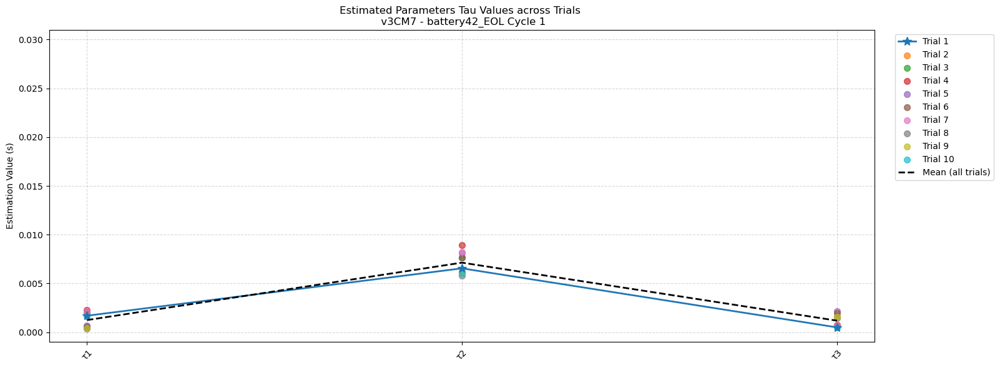

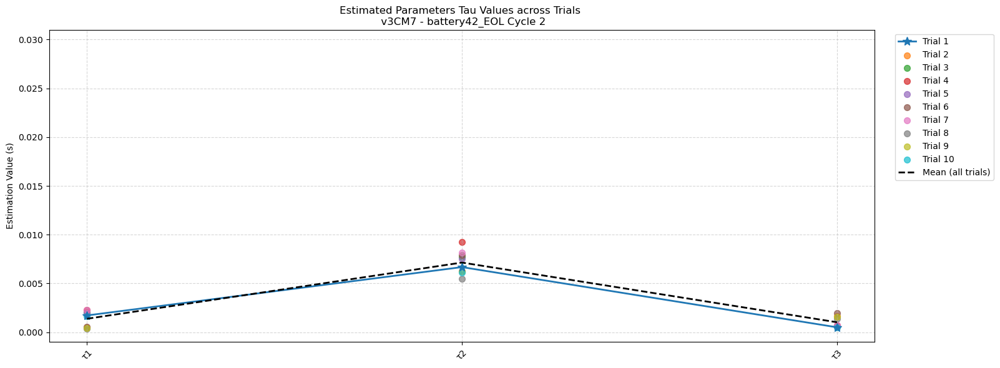

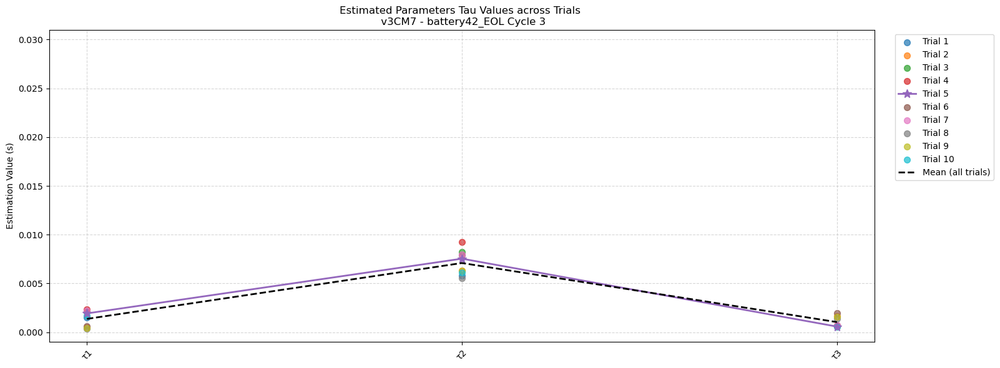

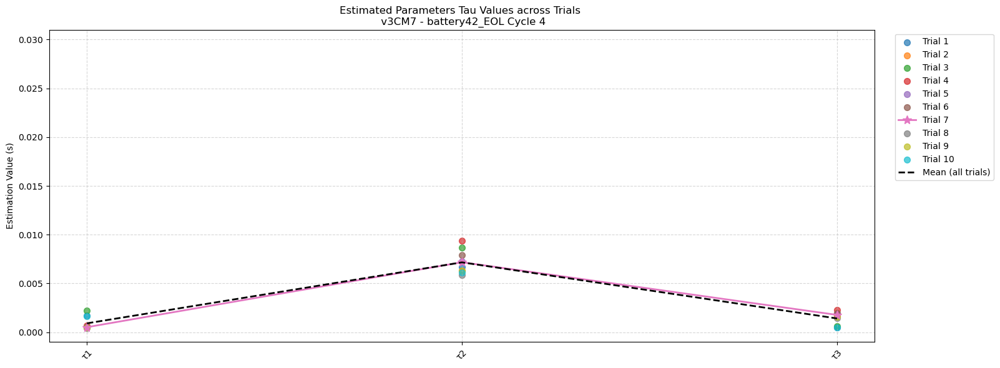

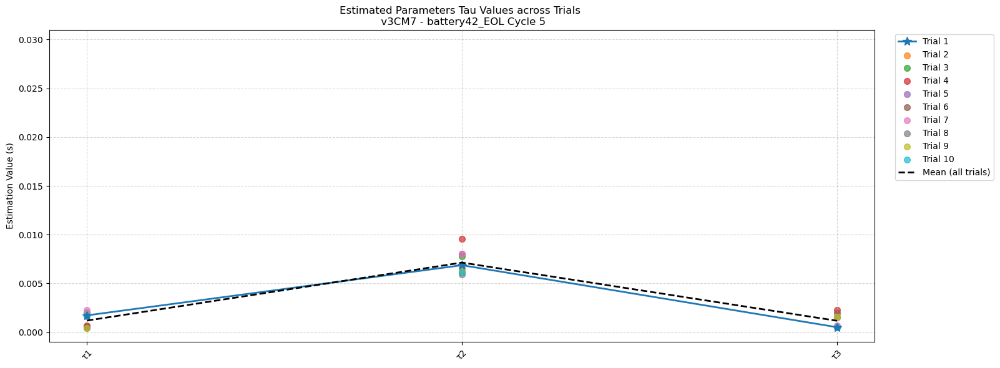

...

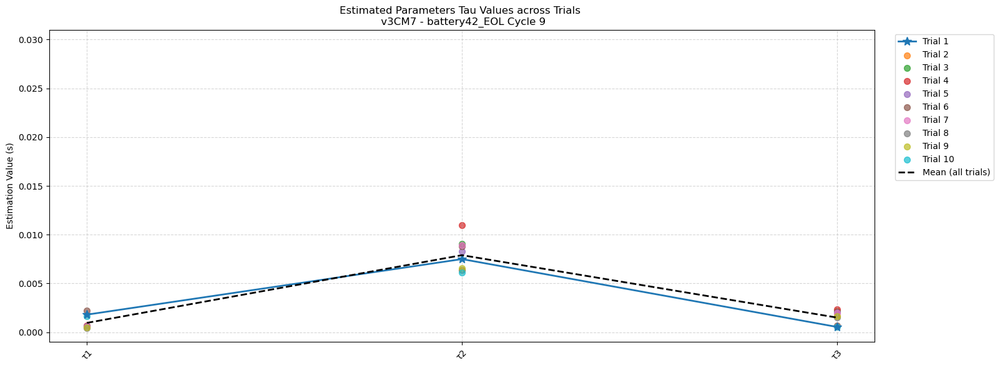

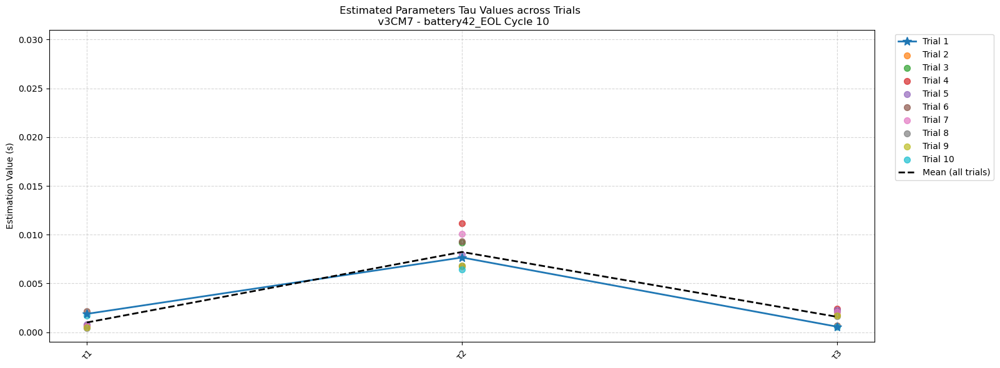

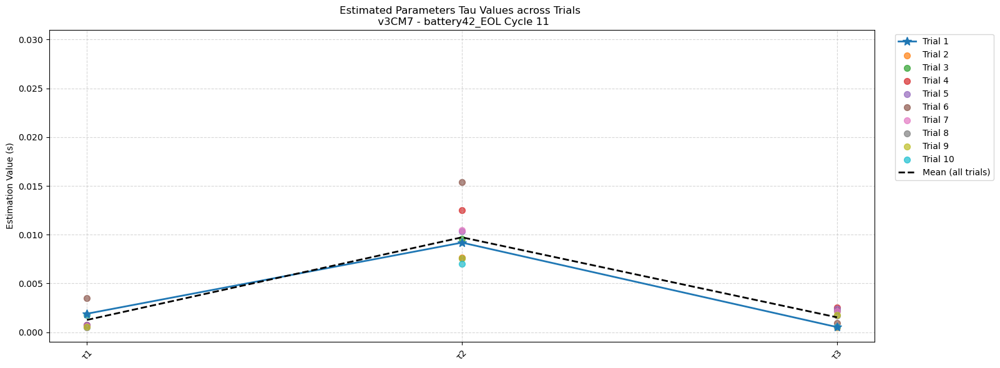

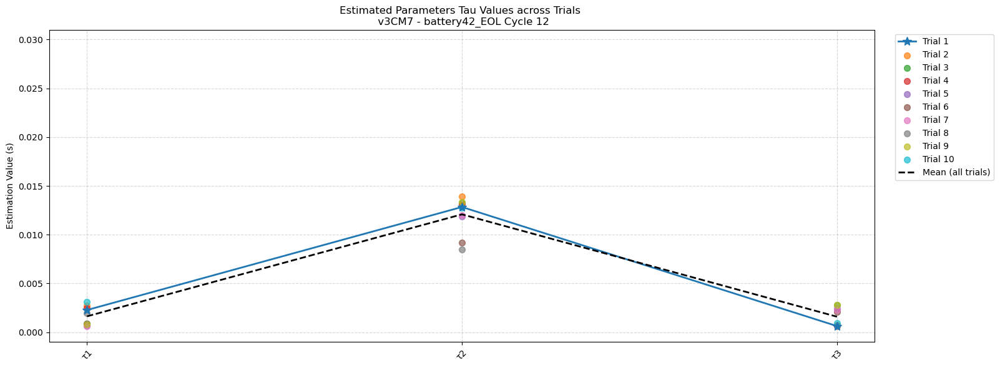

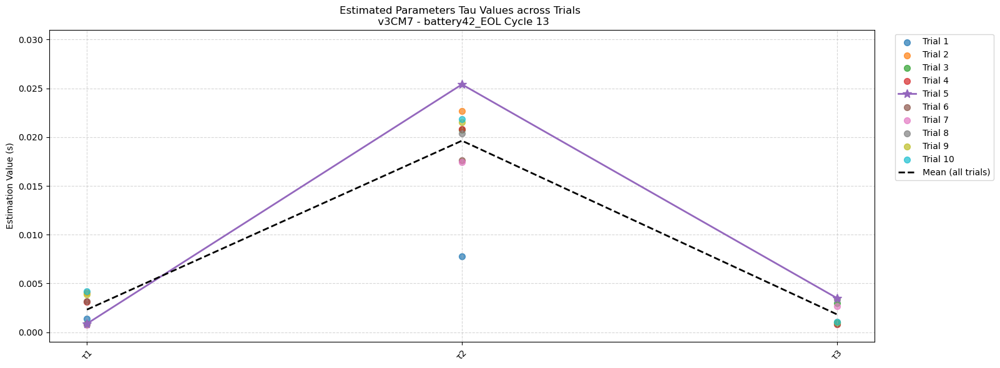

In [27]:
## V3CM7
import pandas as pd
import ast
import numpy as np
import matplotlib.pyplot as plt

target_battery = "battery42_EOL"
target_ECM = "v3CM7"


for cycle in all_battery_data[target_battery].keys():
    # Load and parse
    df = pd.read_csv(f'trial_results_10/objFunc_RMSE_abs/{target_battery}_cycle{cycle}_trials10_objFunc_RMSE_abs_{target_ECM}.csv')
    df['estimated_params'] = df['estimated_params'].apply(ast.literal_eval)

    # Parameter names
    param_names = ['R0', 'R1', 'R2', 'R3',  
                'C1', 'n1', 'C2', 'n2', 'C3', 'n3', 'Aw']

    # Convert to matrix
    param_matrix = np.array(df['estimated_params'].tolist())

    # Compute time constants τ1–τ3
    taus = []
    for row in param_matrix:
        tau = []
        for i in range(3):
            R = row[1 + i]              # R1–R3: index 1–3
            C = row[4 + i*2]            # C1–C3: index 4,6,8
            n = row[5 + i*2]            # n1–n4: index 5,7,9
            tau_val = (R * C) ** (1 / n) if n > 0 else np.nan
            tau.append(tau_val)
        taus.append(tau)

    taus = np.array(taus)

    # Combine for normalization
    # plot_matrix = param_matrix[:, [0,1,2,3]]

    combined_matrix = np.hstack([param_matrix, taus])
    plot_matrix = taus
    
   

    mean_vals = plot_matrix.mean(axis=0)
    # Labels
    tau_names = ['τ1', 'τ2', 'τ3']
    # x_labels = param_names + tau_names
    x_labels = tau_names

    # Plotting
    plt.figure(figsize=(16, 6))

    # Assign a unique color per trial
    colors = plt.cm.tab10(np.linspace(0, 1, len(df)))  # or use another colormap

    for i, (index, row) in enumerate(df.iterrows()):
        y_vals = plot_matrix[i]
        label = f"Trial {row['trial_id']}"
        
        if row['is_best']:
            plt.plot(x_labels, y_vals, label=label, 
                        color=colors[i], marker='*', markersize = 10, linestyle='solid', linewidth=2)
        else:
            plt.scatter(x_labels, y_vals, label=label, 
                        color=colors[i], marker='o', s=50, alpha=0.7)
    plt.plot(x_labels, mean_vals, linestyle='--', color='black', linewidth=2, label='Mean (all trials)', zorder=2)
    plt.xticks(rotation=45)
    plt.ylabel('Estimation Value (s)')
    plt.title(f'Estimated Parameters Tau Values across Trials \n {target_ECM} - {target_battery} Cycle {cycle}')
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.legend(loc='upper right', bbox_to_anchor=(1.15, 1))
    plt.tight_layout()
    plt.ylim(-0.001, 0.031)
    plt.show()


## Box Plots (Parameter Values vs. Cycle Number)

In [29]:
# === CONFIG ===
c7_csv_path = "trial_results_10/objFunc_RMSE_abs/Sorted_battery42_v3CM7_RMSE_abs.csv"
c8_csv_path = "trial_results_10/objFunc_RMSE_abs/Sorted_battery42_v3CM8_RMSE_abs.csv"
output_dir = "ecm_boxplots"

remove_outliers = True  # Option to remove outliers in boxplots
os.makedirs(output_dir, exist_ok=True)

# === LOAD DATA ===
df_c7 = pd.read_csv(c7_csv_path)
df_c8 = pd.read_csv(c8_csv_path)
# Add SOC column using combined Battery_Name + SOH as key
df_c7['SOC'] = df_c7.apply(lambda row: soc_map[(f"{row['Battery_Name']}_{row['SOH']}", row['Cycle'])], axis=1)
df_c8['SOC'] = df_c8.apply(lambda row: soc_map[(f"{row['Battery_Name']}_{row['SOH']}", row['Cycle'])], axis=1)

# === FUNCTION TO PLOT PARAMETERS ===
def plot_parameters_boxplots(df, ecm_name, param_list):
    # Sort SOC from high to low
    df['SOC'] = df['SOC'].round(2)  # Optional: round SOC for better alignment
    unique_soc = sorted(df['SOC'].unique(), reverse=True)  # High to low

    # Ensure the order for SOC in plots
    df['SOC'] = pd.Categorical(df['SOC'], categories=unique_soc, ordered=True)

    for param in param_list:
        plt.figure(figsize=(12, 6))
        if remove_outliers:
            #Remove outliers for better visualization
            sns.boxplot(
                data=df,
                x="SOC",
                y=param,
                hue="SOH",
                showfliers=False,  # hides outlier points in plot
                palette={"BOL": "skyblue", "EOL": "salmon"}
            )
        else:
            sns.boxplot(
                data=df,
                x="SOC", 
                y=param,
                hue="SOH",
                palette={"BOL": "skyblue", "EOL": "salmon"}
            )
       
        plt.title(f"{ecm_name} - {param} vs SOC \n remove_outliers={remove_outliers}")
        plt.ylabel(param)
        plt.xlabel("SOC (%)")
        plt.grid(True, linestyle='--', alpha=0.4)
        plt.legend(title="SOH")
        plt.tight_layout()
        if remove_outliers:
            plt.savefig(f"{output_dir}/{ecm_name}_{param}_SOC_boxplot_removeOutliers.png")
        else:
            plt.savefig(f"{output_dir}/{ecm_name}_{param}_SOC_boxplot.png")
        plt.close()

# === DEFINE PARAMETERS FOR EACH ECM ===
c7_params = ['R0', 'R1', 'R2', 'R3',
             'C1', 'n1', 'C2', 'n2', 'C3', 'n3', 'Aw',
             'tau1', 'tau2', 'tau3',
             'freq1(Hz)', 'freq2(Hz)', 'freq3(Hz)']

c8_params = ['R0', 'R1', 'R2', 'R3', 'R4',
             'C1', 'n1', 'C2', 'n2', 'C3', 'n3', 'C4', 'n4', 'Aw',
             'tau1', 'tau2', 'tau3', 'tau4',
             'freq1(Hz)', 'freq2(Hz)', 'freq3(Hz)', 'freq4(Hz)']

# === PLOT AND SAVE FIGURES ===
plot_parameters_boxplots(df_c7, "v3CM7", c7_params)
plot_parameters_boxplots(df_c8, "v3CM8", c8_params)

print(f"Boxplots saved to '{output_dir}' folder.")

Boxplots saved to 'ecm_boxplots' folder.


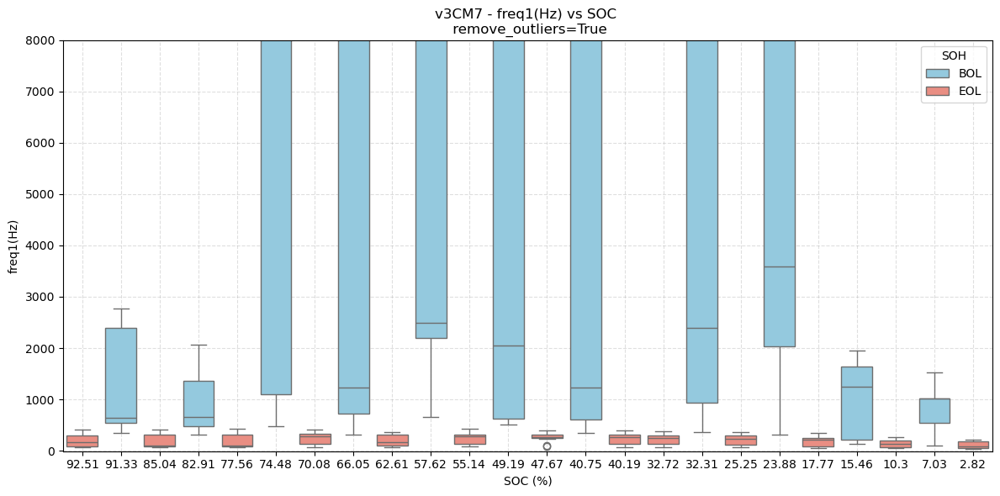

In [33]:
df = df_c7  # or df_c8
ecm_name = "v3CM7"  # or "v3CM8"
param_list = ['freq1(Hz)']  # or c8_params

# Sort SOC from high to low
df['SOC'] = df['SOC'].round(2)  # Optional: round SOC for better alignment
unique_soc = sorted(df['SOC'].unique(), reverse=True)  # High to low

# Ensure the order for SOC in plots
df['SOC'] = pd.Categorical(df['SOC'], categories=unique_soc, ordered=True)

for param in param_list:
    plt.figure(figsize=(12, 6))
    if remove_outliers:
        #Remove outliers for better visualization
        sns.boxplot(
            data=df,
            x="SOC",
            y=param,
            hue="SOH",
            showfliers=True,  # hides outlier points in plot
            palette={"BOL": "skyblue", "EOL": "salmon"}
        )
    else:
        sns.boxplot(
            data=df,
            x="SOC", 
            y=param,
            hue="SOH",
            palette={"BOL": "skyblue", "EOL": "salmon"}
        )
    
    plt.title(f"{ecm_name} - {param} vs SOC \n remove_outliers={remove_outliers}")
    plt.ylabel(param)
    plt.xlabel("SOC (%)")
    plt.grid(True, linestyle='--', alpha=0.4)
    plt.legend(title="SOH")
    plt.ylim(-10, 8000)
    plt.tight_layout()

    plt.show()